In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


/home/cs20btech11063/anaconda3/envs/gpu_env2/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Read the CSV file
df = pd.read_csv('costsensitiveregression.csv')

# apply log transform and add 1 to avoid log(0) to FNC column
# df['FNC'] = np.log(df['FNC'] + 1)

# Separate the independent variables (X) and the dependent variable (y)
X = df.iloc[:, :11]
y = df.iloc[:, 11:13]

# Dropping the YesCount column as it is correlated to NoCount
X.drop('YesCount', axis=1, inplace=True)

print("X Column types:\n", X.dtypes)
print("Y Column types:\n", y.dtypes)

# print the frequency of Status values from df
print("Frequency counts of Status:\n", df['Status'].value_counts())

# Split the data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.4, random_state=42)


# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
X_val = torch.tensor(X_val, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_train = torch.tensor(y_train.to_numpy(), dtype=torch.float32)
y_val = torch.tensor(y_val.to_numpy(), dtype=torch.float32)
y_test = torch.tensor(y_test.to_numpy(), dtype=torch.float32)

# Pretty print all the shapes in one line
print("X_train: ", X_train.shape, "y_train: ", y_train.shape, "X_val: ", X_val.shape, "y_val: ", y_val.shape, "X_test: ", X_test.shape, "y_test: ", y_test.shape)

# Create a custom dataset
class CSLogRegDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Create DataLoader objects for training and testing
train_dataset = CSLogRegDataset(X_train, y_train)
val_dataset = CSLogRegDataset(X_val, y_val)
test_dataset = CSLogRegDataset(X_test, y_test)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


X Column types:
 NotCount      int64
ATPM        float64
PFD         float64
PFG         float64
SFD         float64
SFG         float64
WP          float64
WS          float64
AH          float64
AN          float64
dtype: object
Y Column types:
 Status      int64
FNC       float64
dtype: object
Frequency counts of Status:
 0    103554
1     44082
Name: Status, dtype: int64
X_train:  torch.Size([103345, 10]) y_train:  torch.Size([103345, 2]) X_val:  torch.Size([26574, 10]) y_val:  torch.Size([26574, 2]) X_test:  torch.Size([17717, 10]) y_test:  torch.Size([17717, 2])


In [3]:
# def describe_to_latex(df):
#     table = "\\begin{table}[!ht]\n"
#     table += "\\centering\n"
#     table += "\\caption{Descriptive Statistics}\n"
#     table += "\\label{tab:descriptive_statistics}\n"
#     table += "\\begin{tabular}{l" + "c" * len(df.columns) + "}\n"
#     table += "\\hline\n"
#     table += " & ".join([""] + df.columns.tolist()) + " \\\\ \\hline\n"

#     for index, row in df.iterrows():
#         table += index
#         for value in row:
#             table += " & " + "{:.2f}".format(value)
#         table += " \\\\\n"

#     table += "\\hline\n"
#     table += "\\end{tabular}\n"
#     table += "\\end{table}\n"
#     return table

# describe_latex = describe_to_latex(df.describe(percentiles=[]))
# print(describe_latex)

print(df.describe(percentiles=[]))

print(df.info(verbose=True, memory_usage='deep', show_counts=True))

# def describe_to_latex_transposed(df):
#     table = "\\begin{table}[!ht]\n"
#     table += "\\centering\n"
#     table += "\\caption{Descriptive Statistics}\n"
#     table += "\\label{tab:descriptive_statistics}\n"
#     table += "\\begin{tabular}{l" + "c" * len(df.index) + "}\n"
#     table += "\\hline\n"
#     table += " & ".join([""] + ["\\textbf{" + x + "}" for x in df.index.tolist()]) + " \\\\ \\hline\n"

#     for column in df.columns:
#         table += "\\textbf{" + column + "}"
#         for index, row in df.iterrows():
#             table += " & " + "{:.2f}".format(row[column])
#         table += " \\\\\n"

#     table += "\\hline\n"
#     table += "\\end{tabular}\n"
#     table += "\\end{table}\n"
#     return table
# describe_latex_transposed = describe_to_latex_transposed(df[['FNC']].describe())
# print(describe_latex_transposed)

# check if data has missing values
print(df.isnull().sum())


            NotCount       YesCount           ATPM            PFD  \
count  147636.000000  147636.000000  147636.000000  147636.000000   
mean        7.722107      15.220908       0.253245       0.027062   
std         7.574278       7.596921       0.366280       0.335509   
min         0.000000       0.000000       0.000000       0.000000   
50%         4.000000      19.000000       0.033354       0.000000   
max        23.000000      22.000000       1.000000      79.837480   

                 PFG            SFD            SFG             WP  \
count  147636.000000  147636.000000  147636.000000  147636.000000   
mean        0.050789       0.021648       0.071709       0.271927   
std         0.373370       0.298285       1.135755       2.432425   
min         0.000000       0.000000       0.000000       0.000000   
50%         0.000000       0.000000       0.000000       0.000000   
max        51.944780      61.556900     209.021870     399.606420   

                  WS            

In [4]:
class CostSensitiveLogisticRegression(nn.Module):
    def __init__(self, input_dim):
        super(CostSensitiveLogisticRegression, self).__init__()   
        # Defining the number of input features
        self.input_dim = input_dim
        # Defining the number of output features
        self.output_dim = 1
        self.model = nn.Sequential(
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        out = self.model(x)
        return out

    def compute_loss(self, y_pred, y_true, false_negative_cost):
        epsilon = 1e-7
        true_positive_cost = 4.0
        false_positive_cost = 4.0
        true_negative_cost = 0
        # print("False Negative Cost: ",false_negative_cost.reshape(-1,1).shape)
        
        # print("Y_pred Shape: ",y_pred.shape)
        # print("Y_true Shape: ",y_true.shape)

        # Compute the losses for true positives, false positives, true negatives, and false negatives
        # tp_loss = y_true * torch.log(y_pred + epsilon) * true_positive_cost
        # fp_loss = y_true * torch.log(1 - y_pred + epsilon) * false_positive_cost
        # tn_loss = (1 - y_true) * torch.log(1 - y_pred + epsilon) * true_negative_cost
        # fn_loss = (1 - y_true) * torch.log(y_pred + epsilon) * false_negative_cost
        
        tp_loss = y_true * y_pred * true_positive_cost
        fp_loss = (1 - y_true) * y_pred * false_positive_cost
        fn_loss = (y_true * (1 - y_pred)) * false_negative_cost.reshape(-1,1)
        # tn_loss = (1 - y_true) * (1 - y_pred) * true_negative_cost
        tn_loss = torch.multiply((1 - y_true), (1 - y_pred)) * true_negative_cost
        # print((1-y_true).shape)
        # print((1-y_pred).shape)

        # Compute the total loss
        # total_loss = y_true * (y_pred * true_positive_cost + (1 - y_pred) * false_negative_cost) + (1 - y_true) * (y_pred * false_positive_cost + (1 - y_pred) * true_negative_cost)

        # total_loss = total_loss.mean()
        total_loss = tp_loss + fp_loss + tn_loss + fn_loss
        # print(tp_loss.shape, fp_loss.shape, tn_loss.shape, fn_loss.shape)
        # print("Loss Shape: ",total_loss.shape)
        total_loss = total_loss.mean()

        return total_loss
    
    def compute_expected_cost(self, test_loader):
        # compute the expected cost for the test data
        total_cost = 0
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            false_neg_cost = target[:, 1]
            target = target[:, 0].view(-1, 1)
            loss = self.compute_loss(output, target, false_neg_cost)
            total_cost += loss.item() * data.size(0)
        return total_cost
    
    def train_model(self, train_loader, test_loader, optimizer, num_epochs=10, learning_rate=0.001):
        # Define the loss function and the optimizer
        criterion = self.compute_loss
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        # optimizer = optimizer
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_accuracy = 0
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            # self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)               
            

            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
            
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)

            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
            
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
        
            if test_accuracy > best_accuracy:
                best_accuracy = test_accuracy
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
                
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_accuracy, best_model
    
    def train_model2(self, train_loader, test_loader, optimizer, num_epochs=10, learning_rate=0.001):
        # Define the loss function and the optimizer
        criterion = self.compute_loss
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        # optimizer = optimizer
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_expected_cost = float('inf')
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            # self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)               
            

            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
            
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)
            
            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
            test_expected_cost = self.compute_expected_cost(test_loader)
            
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
        
            if test_expected_cost < best_expected_cost:
                best_expected_cost = test_expected_cost
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
                
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_expected_cost, best_model
    
    def predict(self, test_loader):
        self.eval()
        preds = []
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            pred = output >= 0.5
            preds.append(pred)
        return preds


In [9]:
# cost_sensitive_log_model = CostSensitiveLogisticRegression(input_dim=X_train.shape[1])

# optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=0.001)

# return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=10, learning_rate=0.001)

# train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val


# print("Cost of Cost Sensitive Logistic Regression Model: ", cost_sensitive_log_model.compute_expected_cost(test_loader))

# y_pred = cost_sensitive_log_model(X_test)
# y_pred = y_pred >= 0.5
# y_pred = y_pred.detach().numpy()
# y_pred = y_pred.astype(int)

# # select only first column of y_test
# y_test_label = []
# for i in range(len(y_test)):
#     y_test_label.append(y_test[i][0])

# # convert y_pred and y_test into list
# y_pred = y_pred.tolist()
# # y_test = y_test.tolist()
# # print precision, recall, f1 score
# print(classification_report(y_test_label, y_pred, digits=4))

# # print accuracy
# print("Accuracy: ", accuracy_score(y_test_label, y_pred))

Epoch: 1 	Training Loss: 3.851037 	Training Accuracy: 0.629929 	Validation Loss: 3.090247 	Validation Accuracy: 0.627041
Epoch: 2 	Training Loss: 3.012819 	Training Accuracy: 0.636518 	Validation Loss: 2.947259 	Validation Accuracy: 0.641755
Epoch: 3 	Training Loss: 2.913164 	Training Accuracy: 0.645875 	Validation Loss: 2.881615 	Validation Accuracy: 0.649620
Epoch: 4 	Training Loss: 2.860362 	Training Accuracy: 0.650936 	Validation Loss: 2.842425 	Validation Accuracy: 0.654060
Epoch: 5 	Training Loss: 2.826449 	Training Accuracy: 0.654410 	Validation Loss: 2.815793 	Validation Accuracy: 0.655980
Epoch: 6 	Training Loss: 2.802313 	Training Accuracy: 0.656229 	Validation Loss: 2.796184 	Validation Accuracy: 0.657598
Epoch: 7 	Training Loss: 2.783953 	Training Accuracy: 0.657661 	Validation Loss: 2.780966 	Validation Accuracy: 0.658388
Epoch: 8 	Training Loss: 2.769354 	Training Accuracy: 0.658300 	Validation Loss: 2.768657 	Validation Accuracy: 0.658990
Epoch: 9 	Training Loss: 2.75736

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 4.055817 	Training Accuracy: 0.632861 	Validation Loss: 3.128036 	Validation Accuracy: 0.614398
Epoch: 2 	Training Loss: 3.025310 	Training Accuracy: 0.621733 	Validation Loss: 2.944052 	Validation Accuracy: 0.627756
Epoch: 3 	Training Loss: 2.909549 	Training Accuracy: 0.633345 	Validation Loss: 2.873913 	Validation Accuracy: 0.637804
Epoch: 4 	Training Loss: 2.854118 	Training Accuracy: 0.641453 	Validation Loss: 2.834030 	Validation Accuracy: 0.643712
Epoch: 5 	Training Loss: 2.819790 	Training Accuracy: 0.645992 	Validation Loss: 2.807696 	Validation Accuracy: 0.647550
Epoch: 6 	Training Loss: 2.795831 	Training Accuracy: 0.649156 	Validation Loss: 2.788607 	Validation Accuracy: 0.649846
Epoch: 7 	Training Loss: 2.777830 	Training Accuracy: 0.650820 	Validation Loss: 2.773905 	Validation Accuracy: 0.652141
Epoch: 8 	Training Loss: 2.763607 	Training Accuracy: 0.652417 	Validation Loss: 2.762145 	Validation

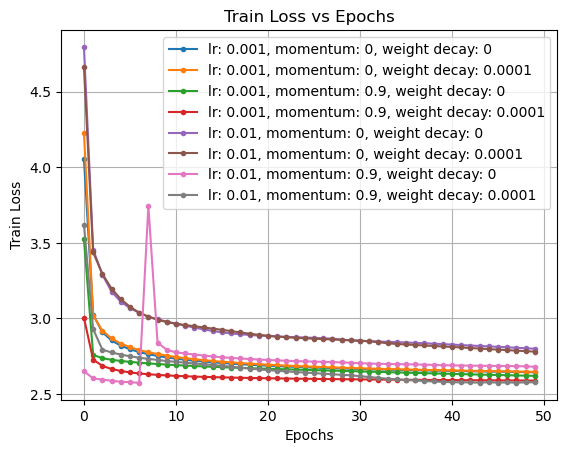

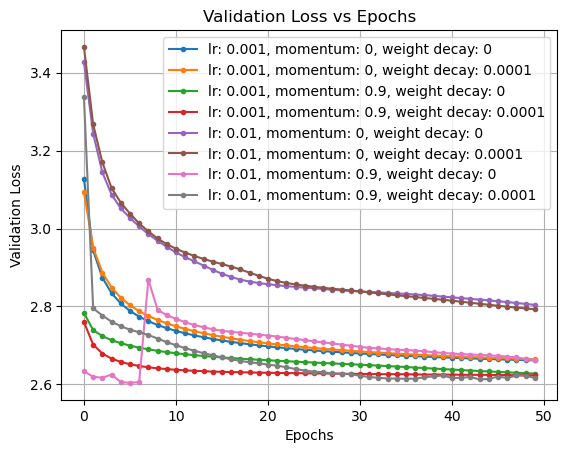

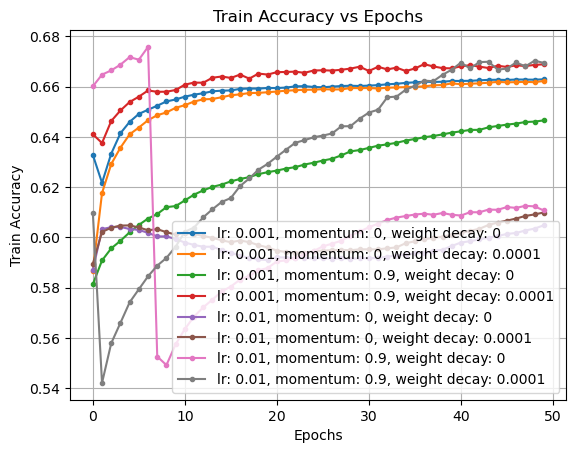

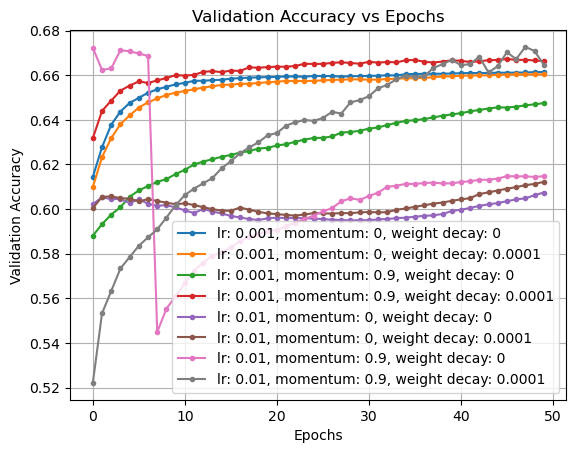

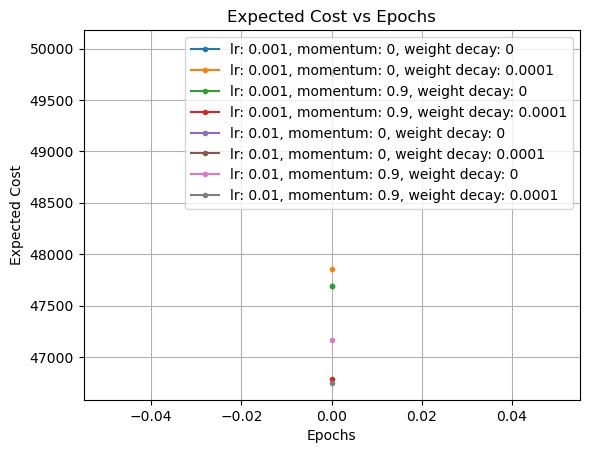

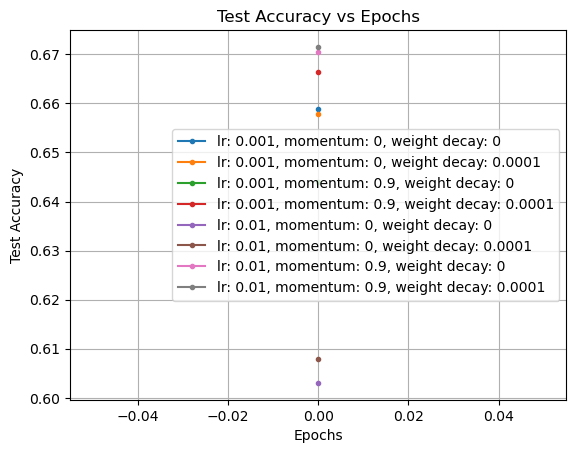

Best expected cost:  46747.16713118553
Best test accuracy:  0.6715019472822713
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001
Best test accuracy:  0.6715019472822713
Best expected cost:  46747.16713118553
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001


In [8]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_cost_lr = []
val_losses_list_cost_lr = []
train_accuracies_list_cost_lr = []
val_accuracies_list_cost_lr = []
expected_costs_list_cost_lr = []
test_accuracy_list_cost_lr = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = CostSensitiveLogisticRegression(input_dim=X_train.shape[1])
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_cost_lr.append(train_losses_cost_sensitive_lr)
            val_losses_list_cost_lr.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_cost_lr.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_cost_lr.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_cost_lr.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_cost_lr.append(accuracy_score(y_test_label, y_pred))


# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_cost_lr))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_cost_lr[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_cost_lr)
best_expected_cost_index = expected_costs_list_cost_lr.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_cost_lr[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_cost_lr)
best_test_accuracy_index = test_accuracy_list_cost_lr.index(best_test_accuracy)
best_expected_cost = expected_costs_list_cost_lr[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)



0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


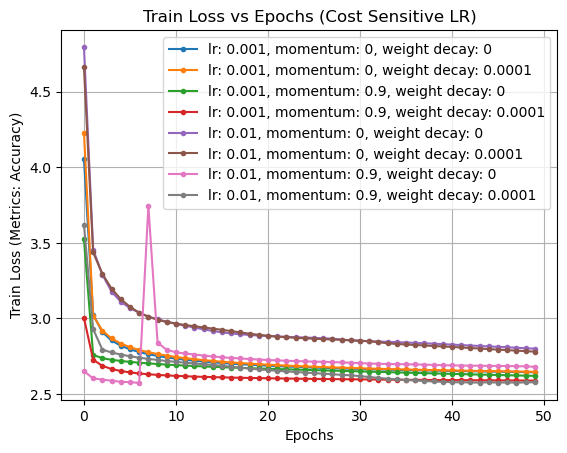

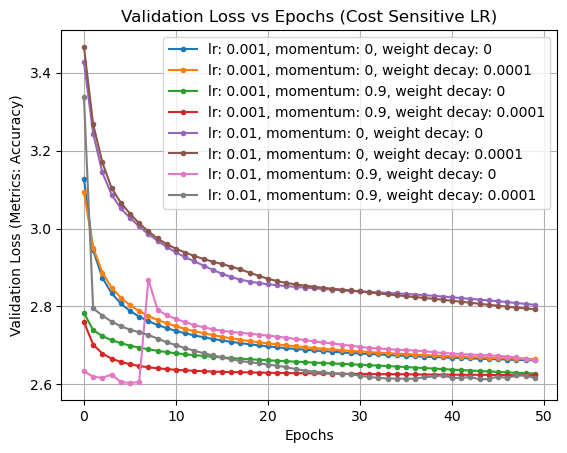

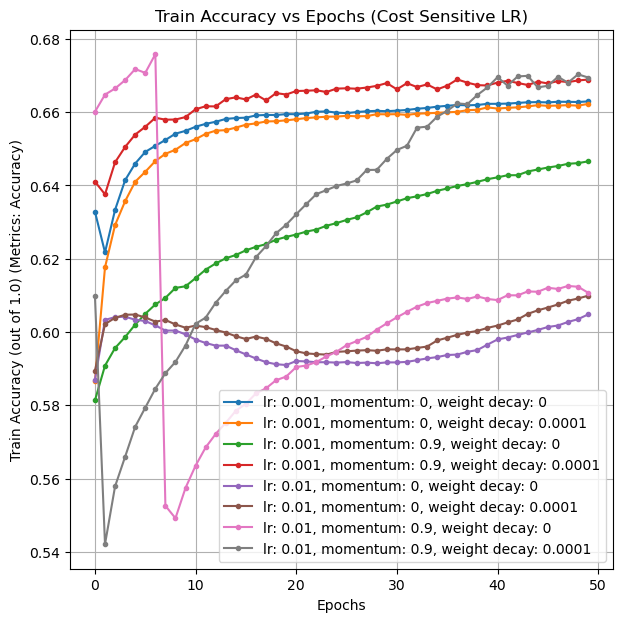

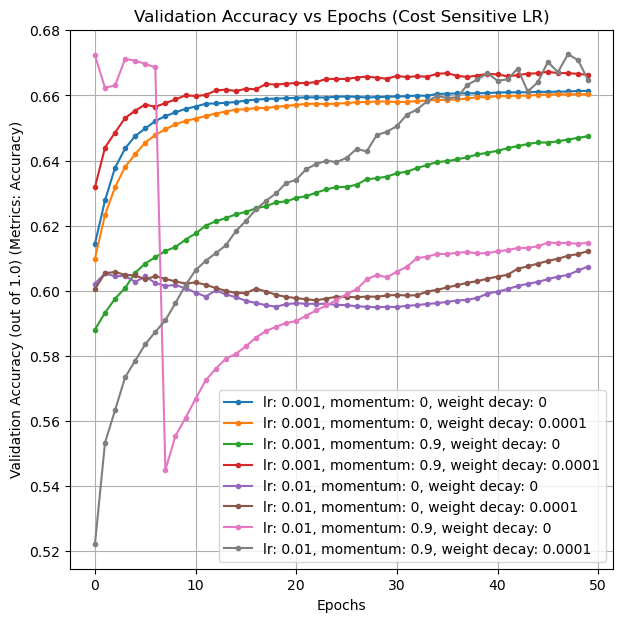

In [41]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_cost_lr[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Accuracy)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Accuracy)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure(figsize=(7, 7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (out of 1.0) (Metrics: Accuracy)")
# plt.ylim(0.3, 0.7)
plt.show()

plt.figure(figsize=(7, 7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (out of 1.0) (Metrics: Accuracy)")
plt.show()


# # plot expected cost for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(expected_costs_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Expected Cost vs Epochs (Cost Sensitive LR)")
# plt.xlabel("Epochs")
# plt.ylabel("Expected Cost (Metrics: Accuracy)")
# plt.show()

# # plot test accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(test_accuracy_list_cost_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Test Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Test Accuracy")
# plt.show()


Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 3.952491 	Training Accuracy: 0.622033 	Validation Loss: 3.097497 	Validation Accuracy: 0.614623
Epoch: 2 	Training Loss: 3.009358 	Training Accuracy: 0.623794 	Validation Loss: 2.940036 	Validation Accuracy: 0.630842
Epoch: 3 	Training Loss: 2.905317 	Training Accuracy: 0.636267 	Validation Loss: 2.873829 	Validation Accuracy: 0.640325
Epoch: 4 	Training Loss: 2.852951 	Training Accuracy: 0.643756 	Validation Loss: 2.835451 	Validation Accuracy: 0.646421
Epoch: 5 	Training Loss: 2.820003 	Training Accuracy: 0.648362 	Validation Loss: 2.809736 	Validation Accuracy: 0.650485
Epoch: 6 	Training Loss: 2.796769 	Training Accuracy: 0.651081 	Validation Loss: 2.790895 	Validation Accuracy: 0.653383
Epoch: 7 	Training Loss: 2.779166 	Training Accuracy: 0.652871 	Validation Loss: 2.776334 	Validation Accuracy: 0.654813
Epoch: 8 	Training Loss: 2.765219 	Training Accuracy: 0.654845 	Validation Loss: 2.764665 	Validation

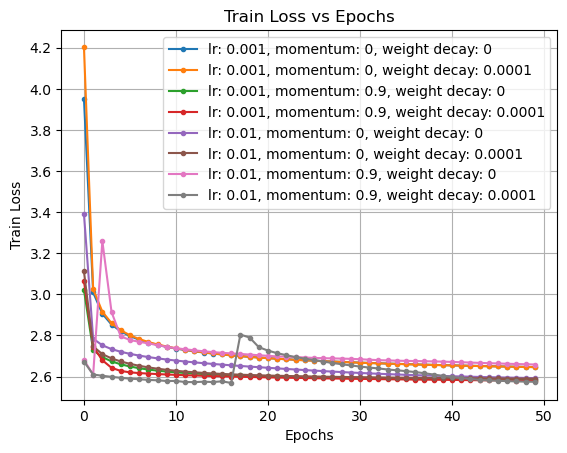

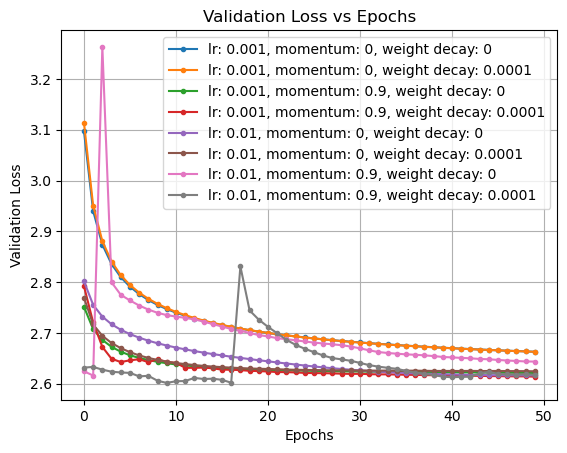

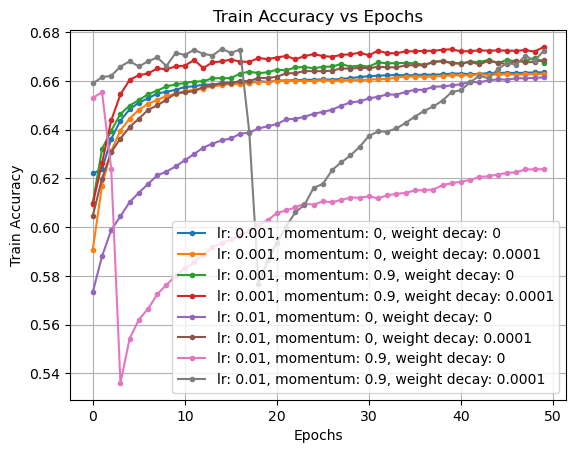

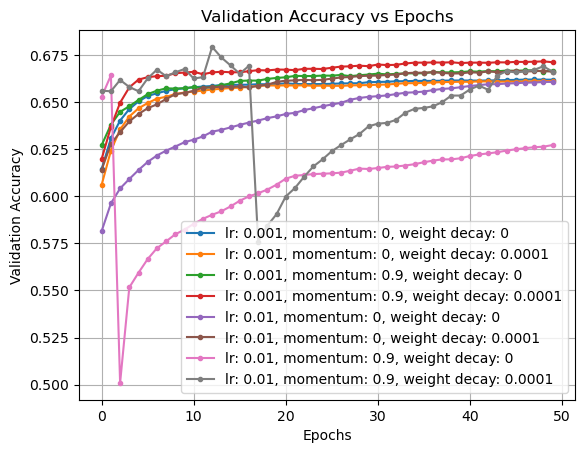

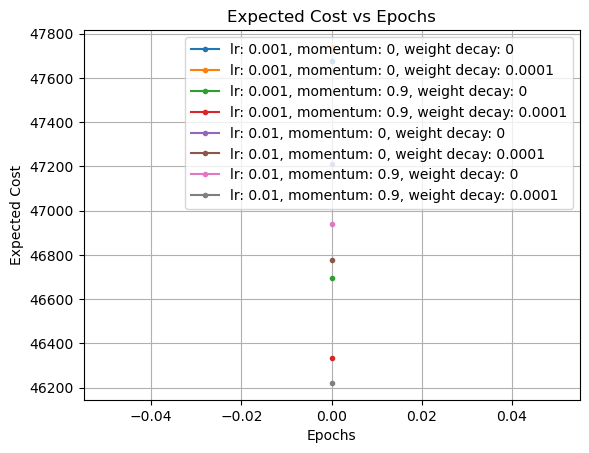

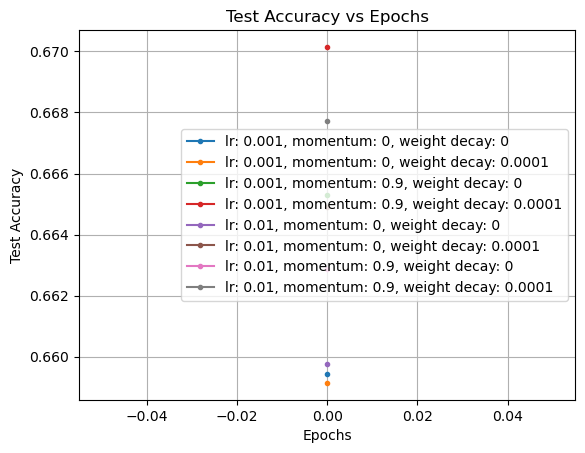

Best expected cost:  46221.42545199394
Best test accuracy:  0.6677202686685104
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001
Best test accuracy:  0.6701473161370435
Best expected cost:  46335.11318683624
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0.0001


In [10]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_cost_lr2 = []
val_losses_list_cost_lr2 = []
train_accuracies_list_cost_lr2 = []
val_accuracies_list_cost_lr2 = []
expected_costs_list_cost_lr2 = []
test_accuracy_list_cost_lr2 = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = CostSensitiveLogisticRegression(input_dim=X_train.shape[1])
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model2(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_cost_lr2.append(train_losses_cost_sensitive_lr)
            val_losses_list_cost_lr2.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_cost_lr2.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_cost_lr2.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_cost_lr2.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_cost_lr2.append(accuracy_score(y_test_label, y_pred))
            
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_cost_lr2))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_cost_lr2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()


# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_cost_lr2)
best_expected_cost_index = expected_costs_list_cost_lr2.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_cost_lr2[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_cost_lr2)
best_test_accuracy_index = test_accuracy_list_cost_lr2.index(best_test_accuracy)
best_expected_cost = expected_costs_list_cost_lr2[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)



0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


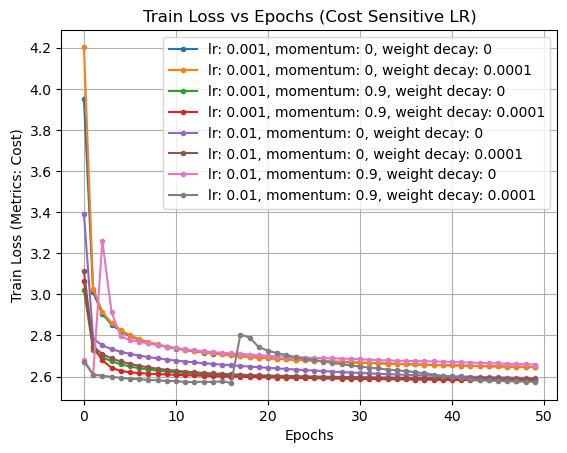

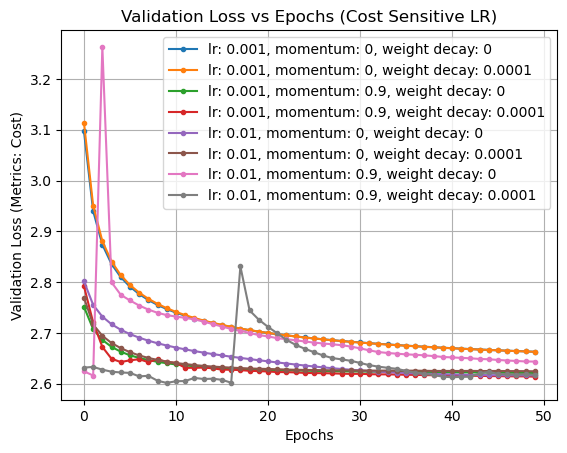

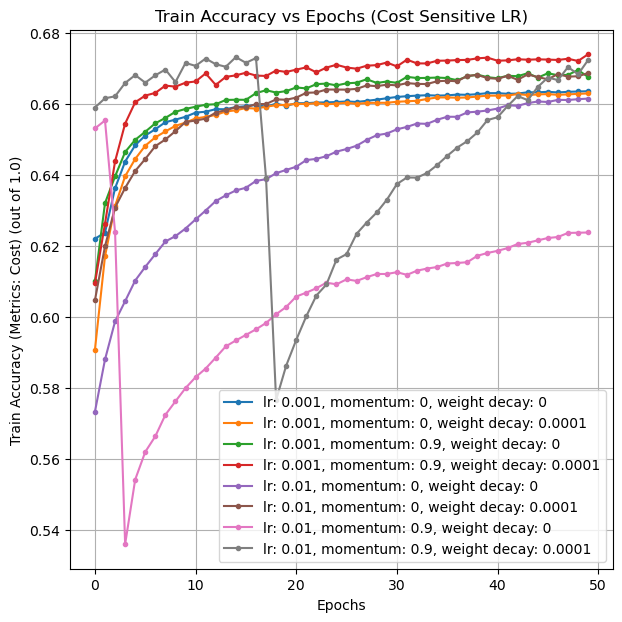

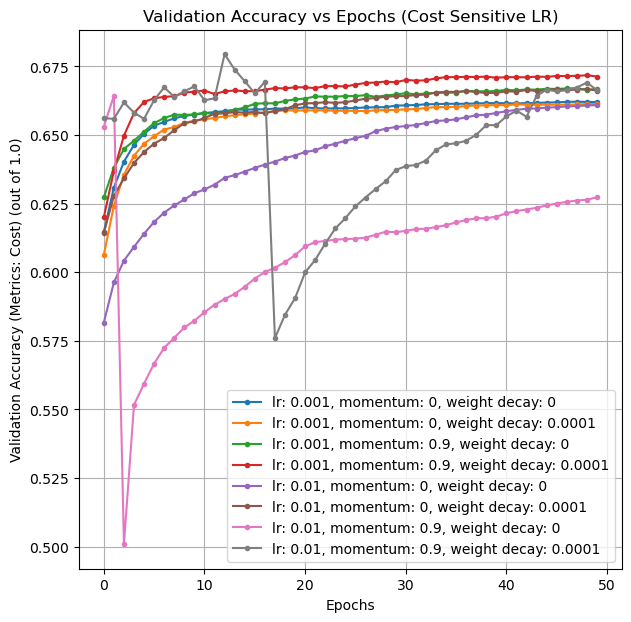

In [45]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_cost_lr2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Cost)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Cost)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure(figsize=(7,7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

plt.figure(figsize=(7,7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_cost_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Cost Sensitive LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

8
0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


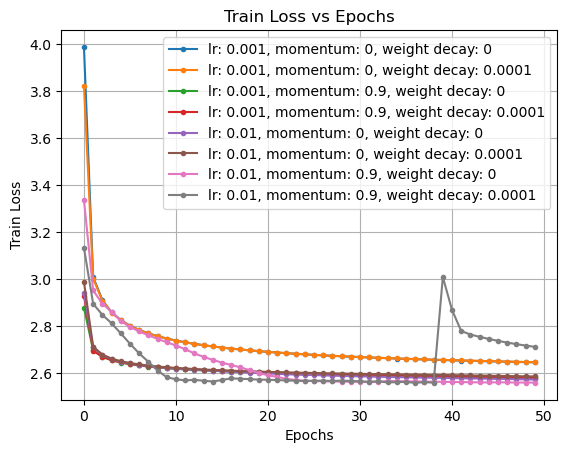

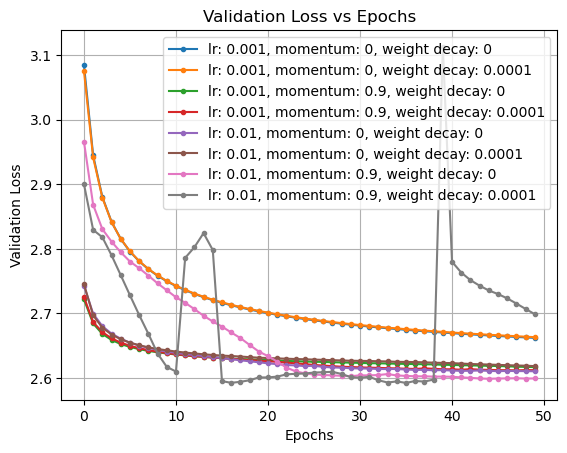

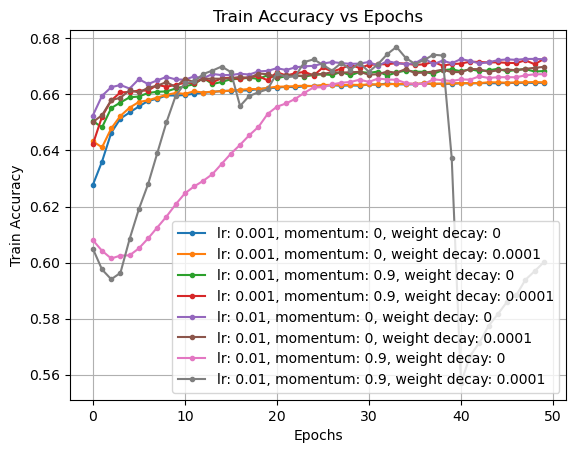

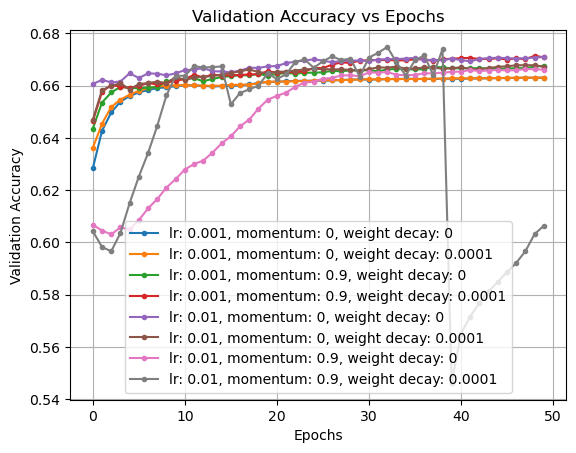

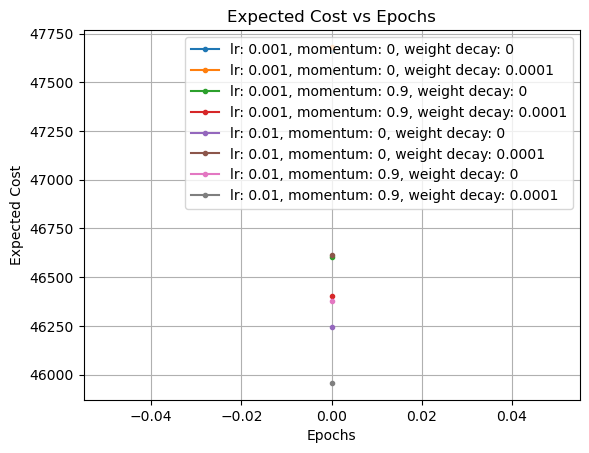

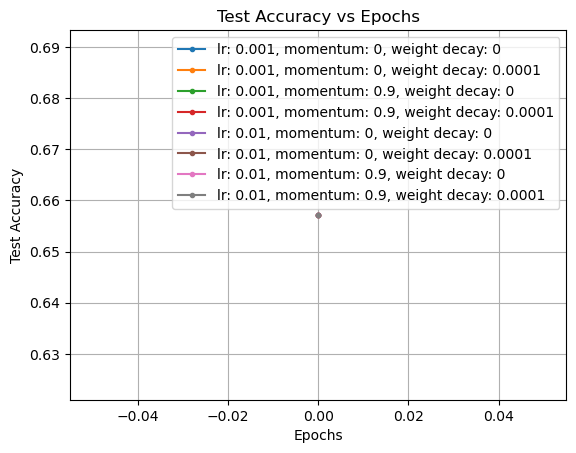

In [30]:
# # plot train and validation loss for each hyperparameter combination
# print(len(train_losses_list))
# # plt.figure(figsize=(20, 10))
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             print(i*4 + j*2 + k, i, j, k)
#             plt.plot(train_losses_list[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Loss vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Train Loss")
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_losses_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Loss vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Loss")
# plt.show()

# # plot train and validation accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(train_accuracies_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Train Accuracy")
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_accuracies_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Accuracy")
# plt.show()

# # plot expected cost for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(expected_costs_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Expected Cost vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Expected Cost")
# plt.show()

# # plot test accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(test_accuracy_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Test Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Test Accuracy")
# plt.show()



# # cost_sensitive_log_model = CostSensitiveLogisticRegression(input_dim=X_train.shape[1])

# # optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=0.001)

# # return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=10, learning_rate=0.001)

# # train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val


# # print("Cost of Cost Sensitive Logistic Regression Model: ", cost_sensitive_log_model.compute_expected_cost(test_loader))

# # y_pred = cost_sensitive_log_model(X_test)
# # y_pred = y_pred >= 0.5
# # y_pred = y_pred.detach().numpy()
# # y_pred = y_pred.astype(int)

# # # select only first column of y_test
# # y_test_label = []
# # for i in range(len(y_test)):
# #     y_test_label.append(y_test[i][0])

# # # convert y_pred and y_test into list
# # y_pred = y_pred.tolist()
# # # y_test = y_test.tolist()
# # # print precision, recall, f1 score
# # print(classification_report(y_test_label, y_pred))

# # # print accuracy
# # print("Accuracy: ", accuracy_score(y_test_label, y_pred))

In [11]:
class LogisticRegression(nn.Module):
    def __init__(self, input_dim):
        super(LogisticRegression, self).__init__()
        # Defining the number of input features
        self.input_dim = input_dim
        # Defining the number of output features
        self.output_dim = 1
        self.model = nn.Sequential(
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )
        self.loss_critetion = nn.BCELoss()
        
    def forward(self, x):
        out = self.model(x)
        return out
    
    def compute_loss(self, y_pred, y_true, false_negative_cost):
        epsilon = 1e-7
        true_positive_cost = 4.0
        false_positive_cost = 4.0
        true_negative_cost = 0
        # print("False Negative Cost: ",false_negative_cost.reshape(-1,1).shape)
        
        # print("Y_pred Shape: ",y_pred.shape)
        # print("Y_true Shape: ",y_true.shape)

        # Compute the losses for true positives, false positives, true negatives, and false negatives
        # tp_loss = y_true * torch.log(y_pred + epsilon) * true_positive_cost
        # fp_loss = y_true * torch.log(1 - y_pred + epsilon) * false_positive_cost
        # tn_loss = (1 - y_true) * torch.log(1 - y_pred + epsilon) * true_negative_cost
        # fn_loss = (1 - y_true) * torch.log(y_pred + epsilon) * false_negative_cost
        
        tp_loss = y_true * y_pred * true_positive_cost
        fp_loss = (1 - y_true) * y_pred * false_positive_cost
        fn_loss = (y_true * (1 - y_pred)) * false_negative_cost.reshape(-1,1)
        # tn_loss = (1 - y_true) * (1 - y_pred) * true_negative_cost
        tn_loss = torch.multiply((1 - y_true), (1 - y_pred)) * true_negative_cost
        # print((1-y_true).shape)
        # print((1-y_pred).shape)

        # Compute the total loss
        # total_loss = y_true * (y_pred * true_positive_cost + (1 - y_pred) * false_negative_cost) + (1 - y_true) * (y_pred * false_positive_cost + (1 - y_pred) * true_negative_cost)

        # total_loss = total_loss.mean()
        total_loss = tp_loss + fp_loss + tn_loss + fn_loss
        # print(tp_loss.shape, fp_loss.shape, tn_loss.shape, fn_loss.shape)
        # print("Loss Shape: ",total_loss.shape)
        total_loss = total_loss.mean()

        return total_loss
    
    def compute_expected_cost(self, test_loader):
        # compute the expected cost for the test data
        total_cost = 0
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            false_neg_cost = target[:, 1]
            target = target[:, 0].view(-1, 1)
            loss = self.compute_loss(output, target, false_neg_cost)
            total_cost += loss.item() * data.size(0)
        return total_cost
    
    def train_model(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.loss_critetion
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_accuracy = 0
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # print('Batch: ', batch_idx)
                # print(data.shape)
                # print(target.shape)
                target = target[:, 0].view(-1, 1)
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
    
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)
        
            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
        
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
            
            if test_accuracy > best_accuracy:
                best_accuracy = test_accuracy
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
            
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_accuracy, best_model
    
    def train_model2(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.loss_critetion
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_expected_cost = float('inf')
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # print('Batch: ', batch_idx)
                # print(data.shape)
                # print(target.shape)
                target = target[:, 0].view(-1, 1)
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
    
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)
        
            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
            test_expected_cost = self.compute_expected_cost(test_loader)
        
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
            
            if test_expected_cost < best_expected_cost:
                best_expected_cost = test_expected_cost
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
            
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_expected_cost, best_model
    
    def predict(self, test_loader):
        self.eval()
        preds = []
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            pred = output >= 0.5
            preds.append(pred)
        return preds
    

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 0.509116 	Training Accuracy: 0.831845 	Validation Loss: 0.427919 	Validation Accuracy: 0.861970
Epoch: 2 	Training Loss: 0.387386 	Training Accuracy: 0.863864 	Validation Loss: 0.366959 	Validation Accuracy: 0.863062
Epoch: 3 	Training Loss: 0.347827 	Training Accuracy: 0.864938 	Validation Loss: 0.342789 	Validation Accuracy: 0.863438
Epoch: 4 	Training Loss: 0.330473 	Training Accuracy: 0.865489 	Validation Loss: 0.328010 	Validation Accuracy: 0.863626
Epoch: 5 	Training Loss: 0.321585 	Training Accuracy: 0.865993 	Validation Loss: 0.321742 	Validation Accuracy: 0.864115
Epoch: 6 	Training Loss: 0.316596 	Training Accuracy: 0.866128 	Validation Loss: 0.318140 	Validation Accuracy: 0.864002
Epoch: 7 	Training Loss: 0.313635 	Training Accuracy: 0.866205 	Validation Loss: 0.315973 	Validation Accuracy: 0.863927
Epoch: 8 	Training Loss: 0.311811 	Training Accuracy: 0.866176 	Validation Loss: 0.314620 	Validation

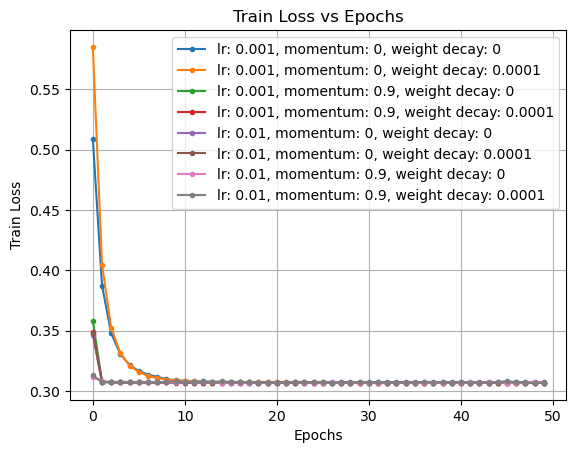

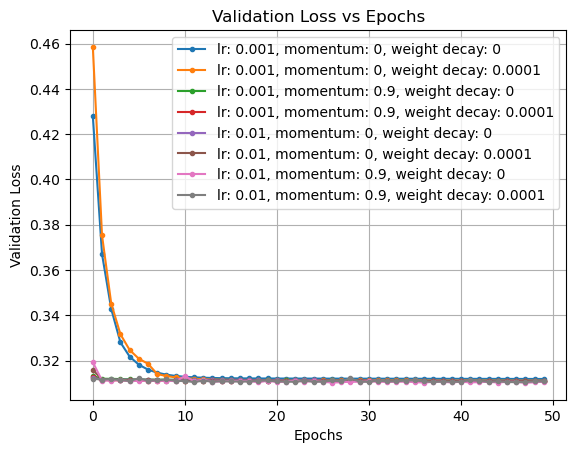

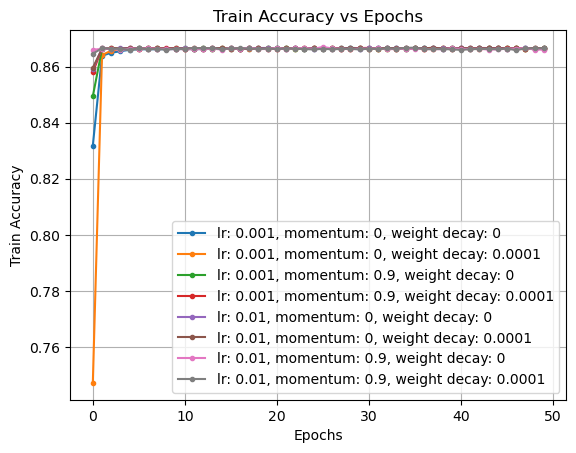

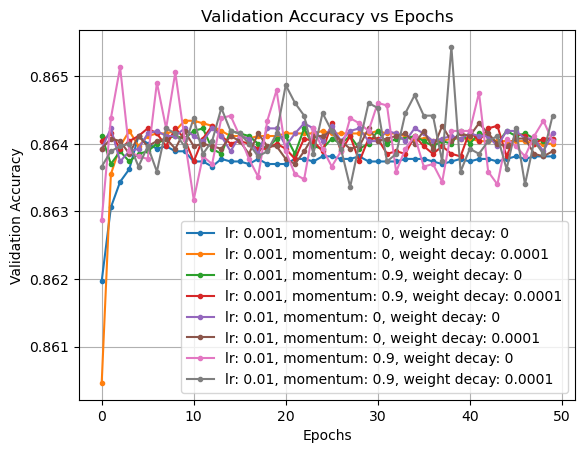

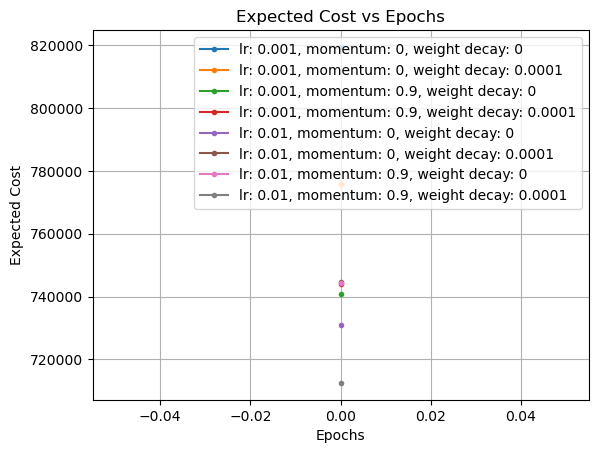

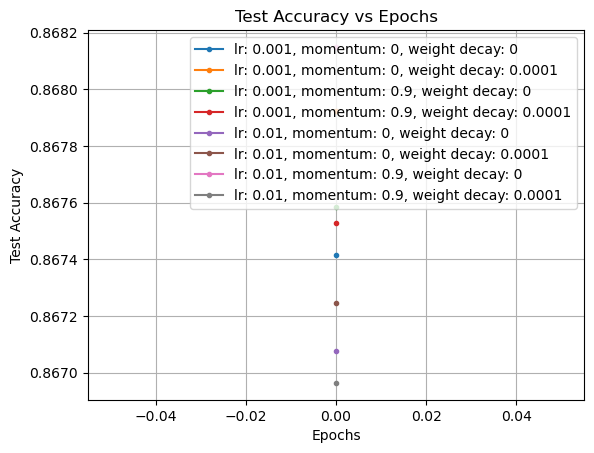

Best expected cost:  712546.4966104031
Best test accuracy:  0.8669639329457584
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001
Best test accuracy:  0.8681492351978326
Best expected cost:  744447.820638895
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001


In [12]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_lr = []
val_losses_list_lr = []
train_accuracies_list_lr = []
val_accuracies_list_lr = []
expected_costs_list_lr = []
test_accuracy_list_lr = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = LogisticRegression(input_dim=X_train.shape[1])
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_lr.append(train_losses_cost_sensitive_lr)
            val_losses_list_lr.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_lr.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_lr.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_lr.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_lr.append(accuracy_score(y_test_label, y_pred))
            
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_lr))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_lr[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_lr)
best_expected_cost_index = expected_costs_list_lr.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_lr[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_lr)
best_test_accuracy_index = test_accuracy_list_lr.index(best_test_accuracy)
best_expected_cost = expected_costs_list_lr[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)



0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


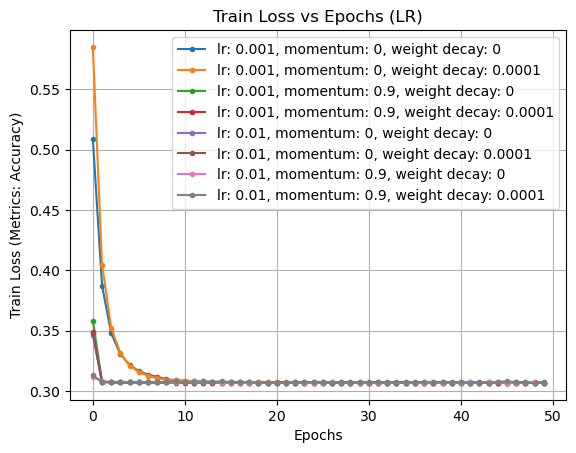

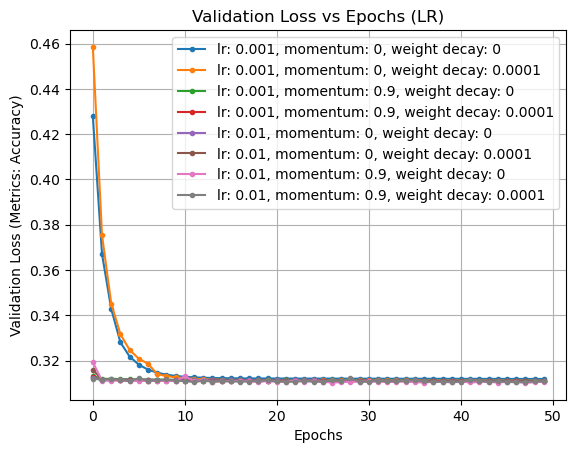

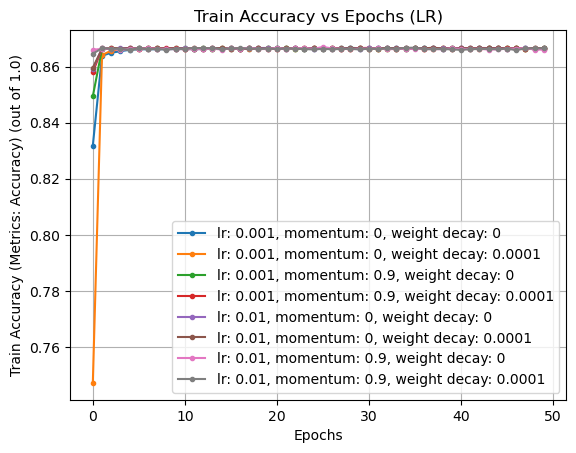

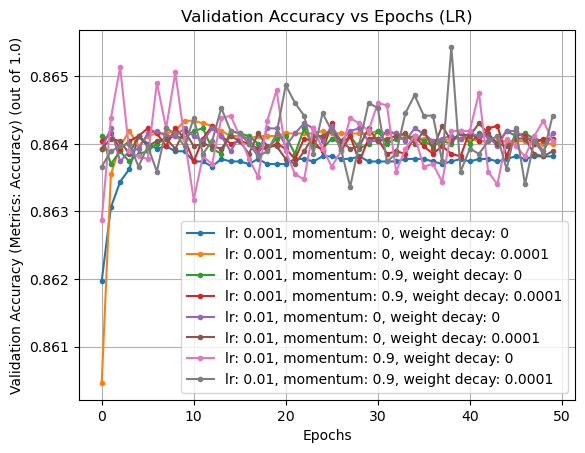

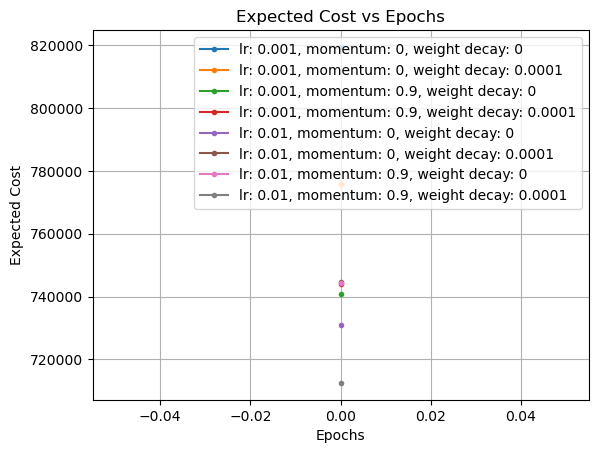

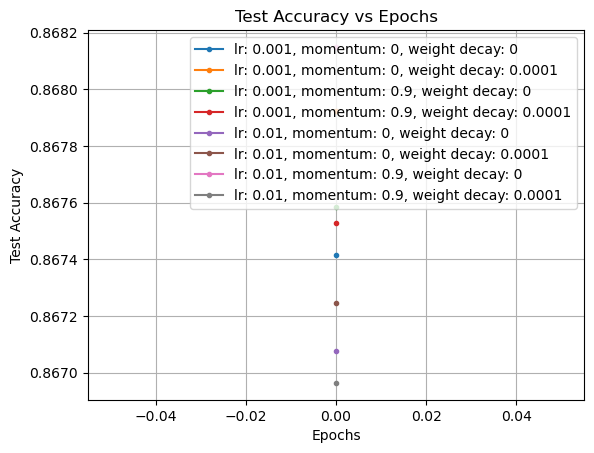

In [47]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_lr[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Accuracy)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Accuracy)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Accuracy) (out of 1.0)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Accuracy) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_lr[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()


Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 0.501772 	Training Accuracy: 0.837051 	Validation Loss: 0.415866 	Validation Accuracy: 0.863814
Epoch: 2 	Training Loss: 0.379442 	Training Accuracy: 0.865944 	Validation Loss: 0.358655 	Validation Accuracy: 0.864002
Epoch: 3 	Training Loss: 0.342740 	Training Accuracy: 0.866051 	Validation Loss: 0.336462 	Validation Accuracy: 0.863777
Epoch: 4 	Training Loss: 0.326958 	Training Accuracy: 0.866138 	Validation Loss: 0.325918 	Validation Accuracy: 0.863814
Epoch: 5 	Training Loss: 0.318980 	Training Accuracy: 0.866128 	Validation Loss: 0.320300 	Validation Accuracy: 0.863890
Epoch: 6 	Training Loss: 0.314553 	Training Accuracy: 0.866147 	Validation Loss: 0.317112 	Validation Accuracy: 0.863890
Epoch: 7 	Training Loss: 0.311945 	Training Accuracy: 0.866263 	Validation Loss: 0.315202 	Validation Accuracy: 0.864078
Epoch: 8 	Training Loss: 0.310336 	Training Accuracy: 0.866312 	Validation Loss: 0.314022 	Validation

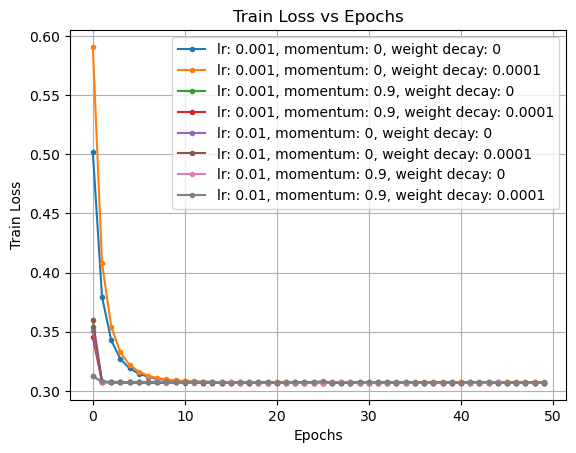

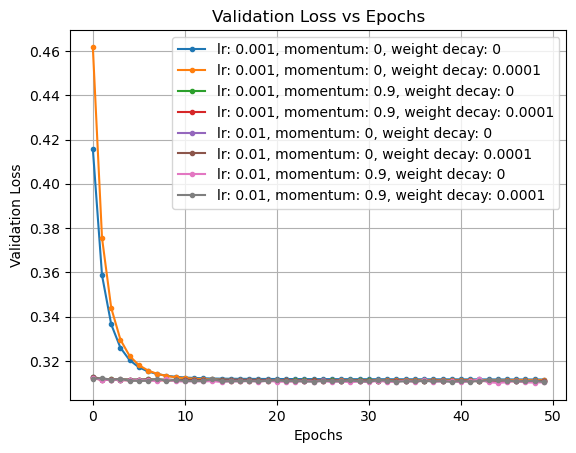

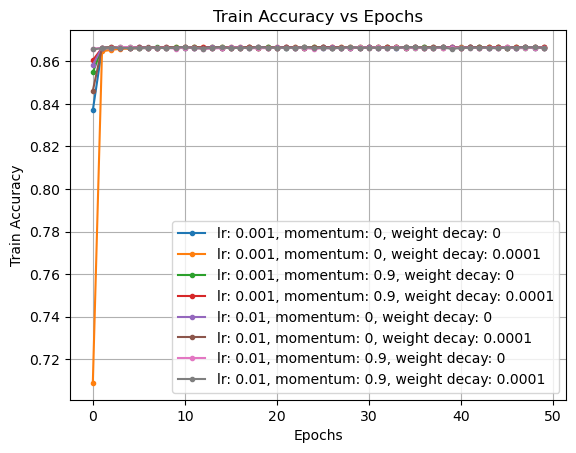

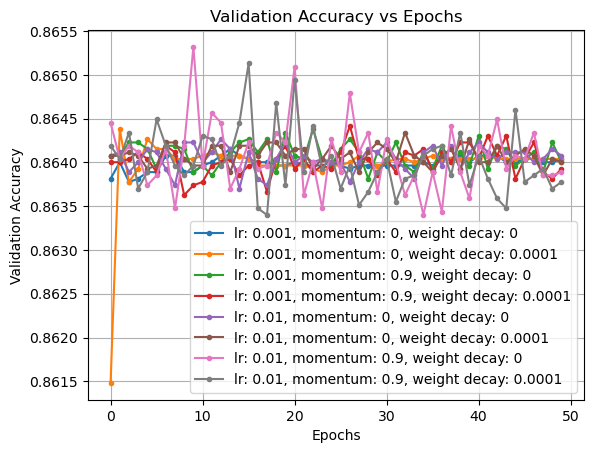

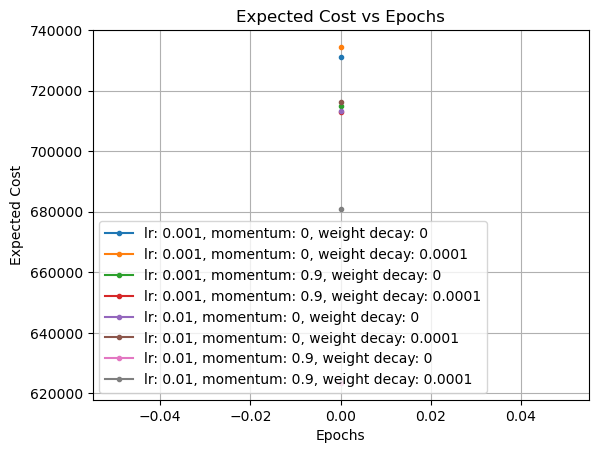

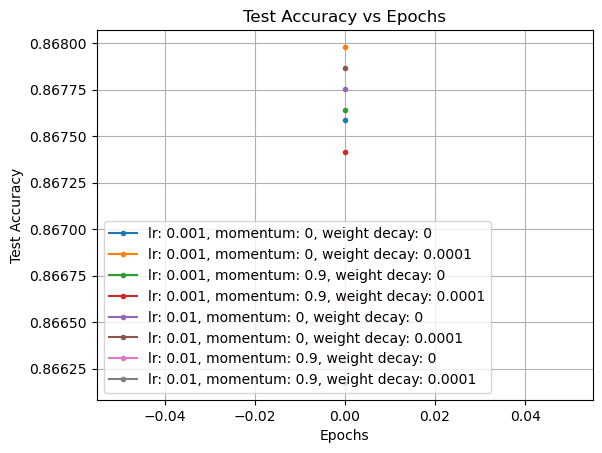

Best expected cost:  623439.4506309032
Best test accuracy:  0.8666252751594514
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001
Best test accuracy:  0.8679799063046791
Best expected cost:  734470.6171450615
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0


In [13]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_lr2 = []
val_losses_list_lr2 = []
train_accuracies_list_lr2 = []
val_accuracies_list_lr2 = []
expected_costs_list_lr2 = []
test_accuracy_list_lr2 = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = LogisticRegression(input_dim=X_train.shape[1])
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model2(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_lr2.append(train_losses_cost_sensitive_lr)
            val_losses_list_lr2.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_lr2.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_lr2.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_lr2.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_lr2.append(accuracy_score(y_test_label, y_pred))
            
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_lr2))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_lr2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_lr2)
best_expected_cost_index = expected_costs_list_lr2.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_lr2[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_lr2)
best_test_accuracy_index = test_accuracy_list_lr2.index(best_test_accuracy)
best_expected_cost = expected_costs_list_lr2[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)


0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


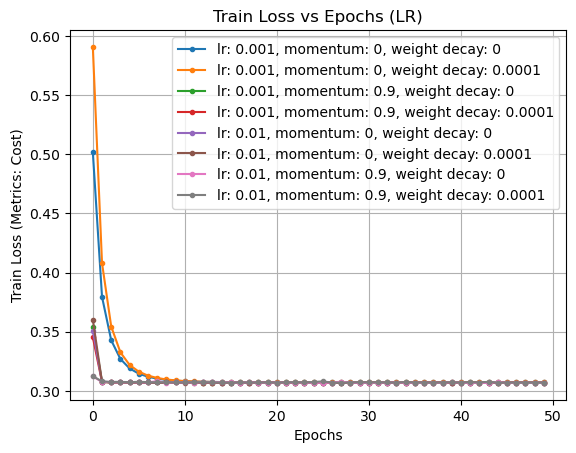

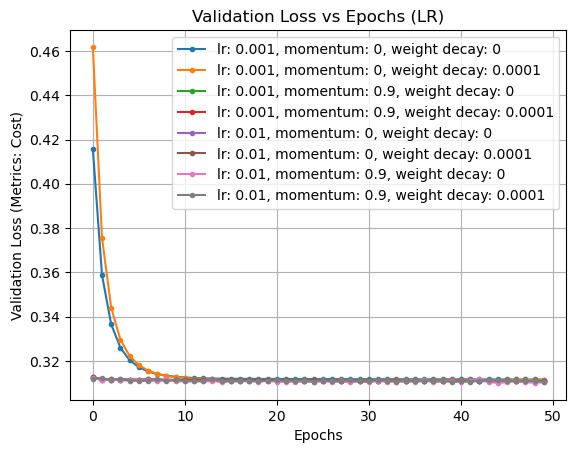

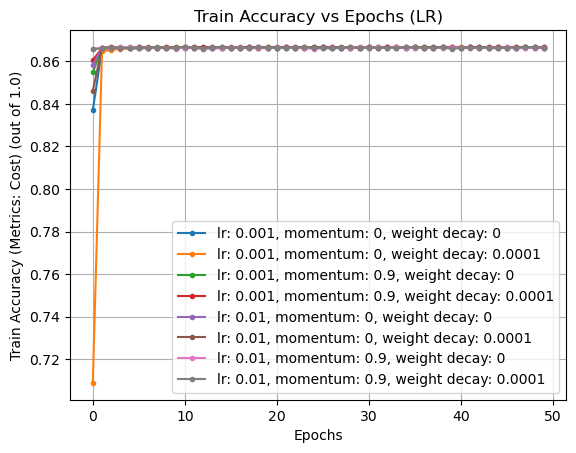

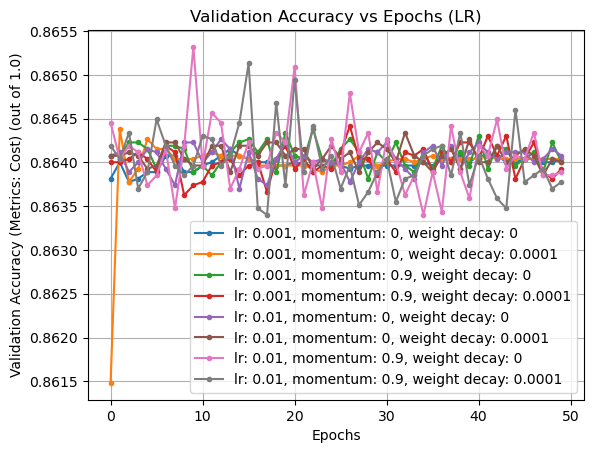

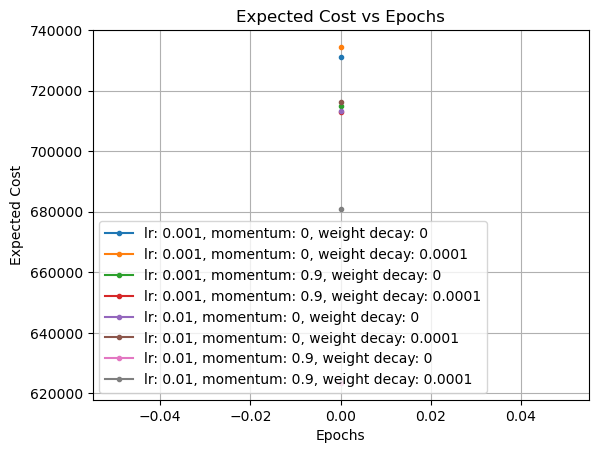

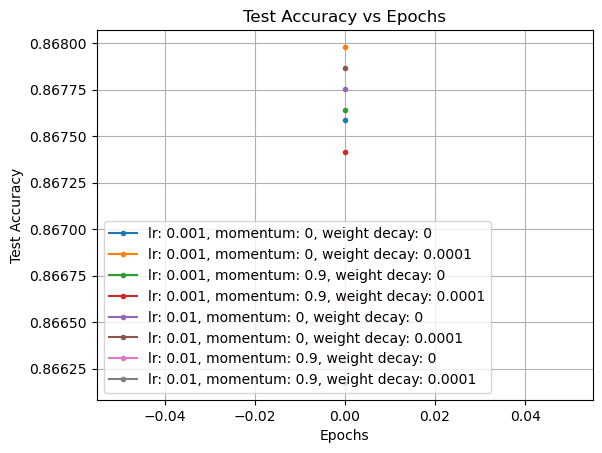

In [48]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_lr2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Cost)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Cost)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (LR)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_lr2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()


8
0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


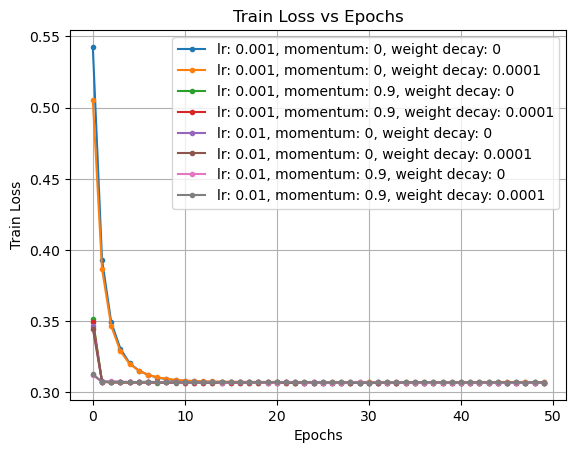

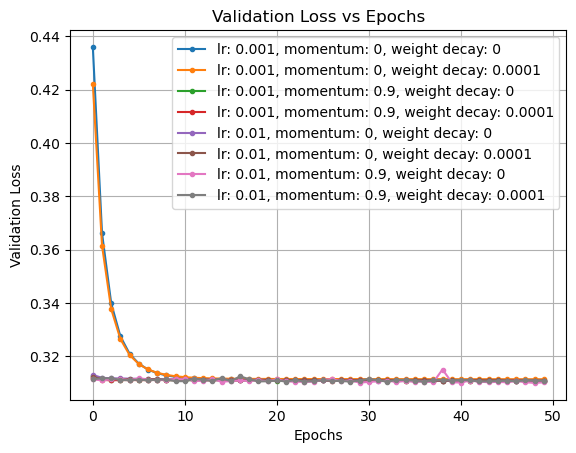

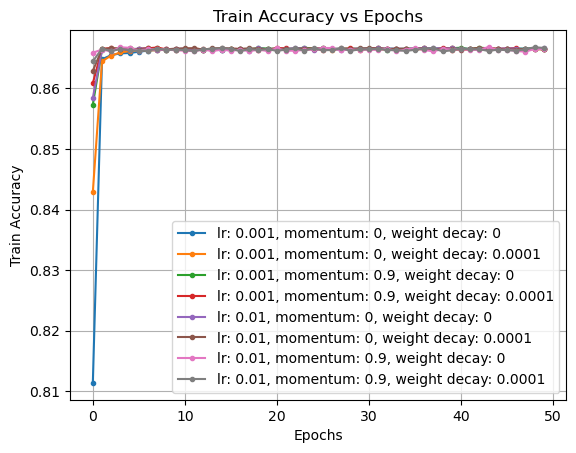

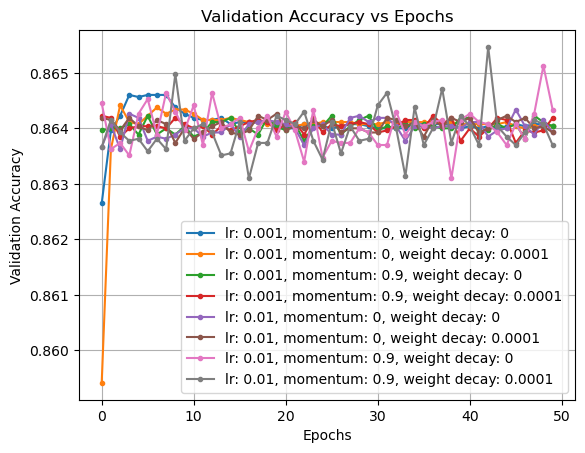

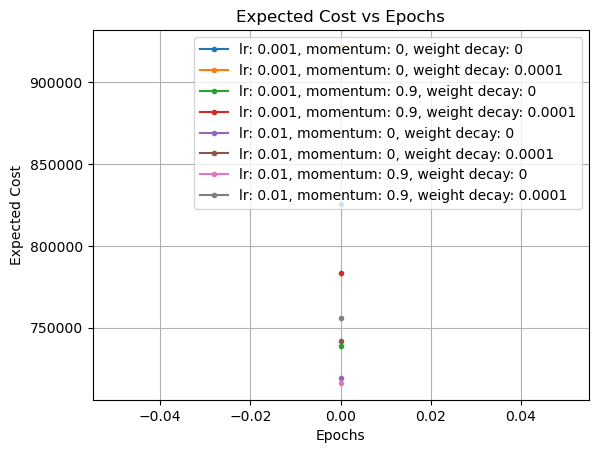

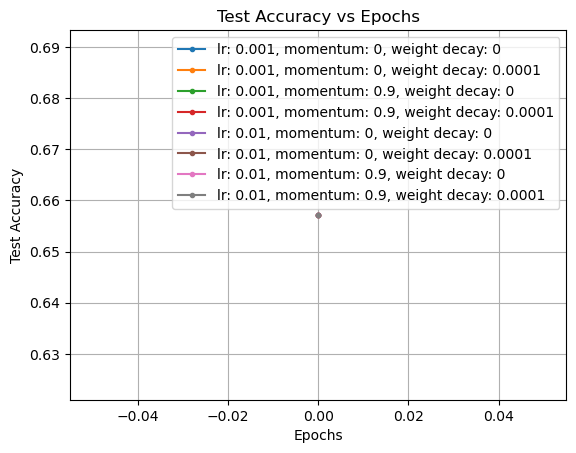

In [35]:
# # plot train and validation loss for each hyperparameter combination
# print(len(train_losses_list))
# # plt.figure(figsize=(20, 10))
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             print(i*4 + j*2 + k, i, j, k)
#             plt.plot(train_losses_list[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Loss vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Train Loss")
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_losses_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Loss vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Loss")
# plt.show()

# # plot train and validation accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(train_accuracies_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Train Accuracy")
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_accuracies_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Accuracy")
# plt.show()

# # plot expected cost for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(expected_costs_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Expected Cost vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Expected Cost")
# plt.show()

# # plot test accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(test_accuracy_list[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Test Accuracy vs Epochs")
# plt.xlabel("Epochs")
# plt.ylabel("Test Accuracy")
# plt.show()



# # cost_sensitive_log_model = CostSensitiveLogisticRegression(input_dim=X_train.shape[1])

# # optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=0.001)

# # return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=10, learning_rate=0.001)

# # train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val


# # print("Cost of Cost Sensitive Logistic Regression Model: ", cost_sensitive_log_model.compute_expected_cost(test_loader))

# # y_pred = cost_sensitive_log_model(X_test)
# # y_pred = y_pred >= 0.5
# # y_pred = y_pred.detach().numpy()
# # y_pred = y_pred.astype(int)

# # # select only first column of y_test
# # y_test_label = []
# # for i in range(len(y_test)):
# #     y_test_label.append(y_test[i][0])

# # # convert y_pred and y_test into list
# # y_pred = y_pred.tolist()
# # # y_test = y_test.tolist()
# # # print precision, recall, f1 score
# # print(classification_report(y_test_label, y_pred))

# # # print accuracy
# # print("Accuracy: ", accuracy_score(y_test_label, y_pred))

In [14]:
# log_model = LogisticRegression(input_dim=X_train.shape[1])
# return_val = log_model.train_model(train_loader, val_loader, num_epochs=10, learning_rate=0.001)
# print("Cost of Logistic Regression Model: ", log_model.compute_expected_cost(test_loader))

# # Display confusion matrix
# y_pred = log_model(X_test)
# y_pred = y_pred >= 0.5
# y_pred = y_pred.detach().numpy()
# y_pred = y_pred.astype(int)

# # select only first column of y_test
# y_test_label = []
# for i in range(len(y_test)):
#     y_test_label.append(y_test[i][0])

# # convert y_pred and y_test into list
# y_pred = y_pred.tolist()
# # y_test = y_test.tolist()
# # print precision, recall, f1 score
# print(classification_report(y_test_label, y_pred))

# # print accuracy
# print("Accuracy: ", accuracy_score(y_test_label, y_pred))


In [15]:
# Class for Neural Network
class NeuralNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(NeuralNetwork, self).__init__()
        # Defining the number of input nodes, hidden nodes and output nodes
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.output_dim = 1
        # Defining the layers
        self.model = nn.Sequential(
            nn.Linear(self.input_dim, self.hidden_dim),
            nn.ReLU(),
            nn.Linear(self.hidden_dim, self.output_dim),
            nn.Sigmoid()
        )

        self.loss_critetion = nn.BCELoss()
        
    def forward(self, x):
        # Forward pass through the network
        x = self.model(x)
        return x
    
    def compute_loss(self, y_pred, y_true, false_negative_cost):
        epsilon = 1e-7
        true_positive_cost = 4.0
        false_positive_cost = 4.0
        true_negative_cost = 0
        # print("False Negative Cost: ",false_negative_cost.reshape(-1,1).shape)
        
        # print("Y_pred Shape: ",y_pred.shape)
        # print("Y_true Shape: ",y_true.shape)

        # Compute the losses for true positives, false positives, true negatives, and false negatives
        # tp_loss = y_true * torch.log(y_pred + epsilon) * true_positive_cost
        # fp_loss = y_true * torch.log(1 - y_pred + epsilon) * false_positive_cost
        # tn_loss = (1 - y_true) * torch.log(1 - y_pred + epsilon) * true_negative_cost
        # fn_loss = (1 - y_true) * torch.log(y_pred + epsilon) * false_negative_cost
        
        tp_loss = y_true * y_pred * true_positive_cost
        fp_loss = (1 - y_true) * y_pred * false_positive_cost
        fn_loss = (y_true * (1 - y_pred)) * false_negative_cost.reshape(-1,1)
        # tn_loss = (1 - y_true) * (1 - y_pred) * true_negative_cost
        tn_loss = torch.multiply((1 - y_true), (1 - y_pred)) * true_negative_cost
        # print((1-y_true).shape)
        # print((1-y_pred).shape)

        # Compute the total loss
        # total_loss = y_true * (y_pred * true_positive_cost + (1 - y_pred) * false_negative_cost) + (1 - y_true) * (y_pred * false_positive_cost + (1 - y_pred) * true_negative_cost)

        # total_loss = total_loss.mean()
        total_loss = tp_loss + fp_loss + tn_loss + fn_loss
        # print(tp_loss.shape, fp_loss.shape, tn_loss.shape, fn_loss.shape)
        # print("Loss Shape: ",total_loss.shape)
        total_loss = total_loss.mean()

        return total_loss

    def compute_expected_cost(self, test_loader):
        self.eval()
        # compute the expected cost for the test data
        total_cost = 0
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            false_neg_cost = target[:, 1]
            target = target[:, 0].view(-1, 1)
            loss = self.compute_loss(output, target, false_neg_cost)
            total_cost += loss.item() * data.size(0)
        return total_cost
    def train_model(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.loss_critetion
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_accuracy = 0
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):

                target = target[:, 0].view(-1, 1)
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
    
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)
        
            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
        
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
            
            if test_accuracy > best_accuracy:
                best_accuracy = test_accuracy
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
            
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_accuracy, best_model
    
    def train_model2(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.loss_critetion
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_accuracy = float('inf')
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):

                target = target[:, 0].view(-1, 1)
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
    
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)
        
            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
        
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
            
            test_expected_cost = self.compute_expected_cost(test_loader)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
            
            if test_expected_cost < best_accuracy:
                best_accuracy = test_expected_cost
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
            
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_accuracy, best_model
    

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 0.597047 	Training Accuracy: 0.691886 	Validation Loss: 0.531212 	Validation Accuracy: 0.702454
Epoch: 2 	Training Loss: 0.475390 	Training Accuracy: 0.776545 	Validation Loss: 0.423212 	Validation Accuracy: 0.841913
Epoch: 3 	Training Loss: 0.383025 	Training Accuracy: 0.854778 	Validation Loss: 0.357980 	Validation Accuracy: 0.858320
Epoch: 4 	Training Loss: 0.338574 	Training Accuracy: 0.862209 	Validation Loss: 0.333898 	Validation Accuracy: 0.862271
Epoch: 5 	Training Loss: 0.323857 	Training Accuracy: 0.864841 	Validation Loss: 0.322946 	Validation Accuracy: 0.862685
Epoch: 6 	Training Loss: 0.318553 	Training Accuracy: 0.865296 	Validation Loss: 0.319725 	Validation Accuracy: 0.862873
Epoch: 7 	Training Loss: 0.315159 	Training Accuracy: 0.865480 	Validation Loss: 0.317943 	Validation Accuracy: 0.863438
Epoch: 8 	Training Loss: 0.313575 	Training Accuracy: 0.865654 	Validation Loss: 0.316753 	Validation

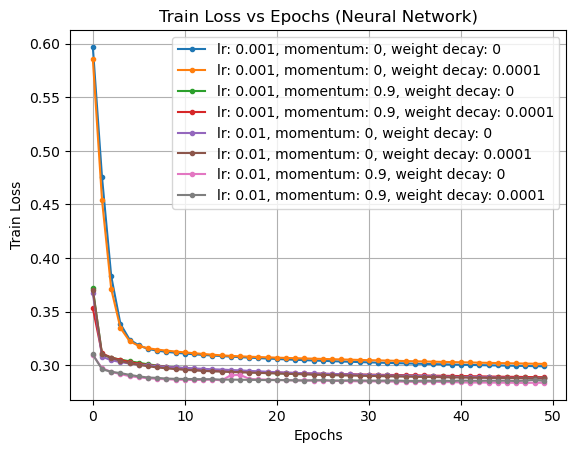

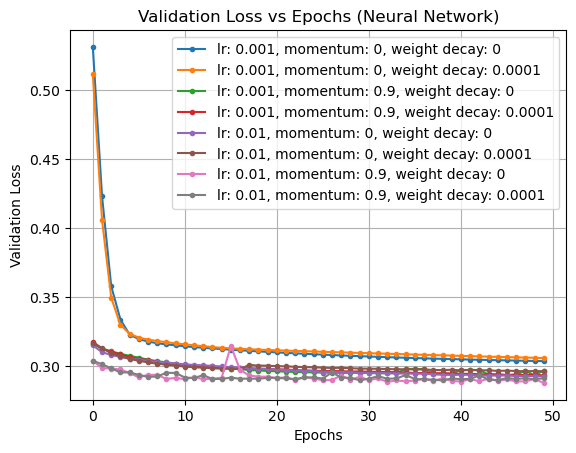

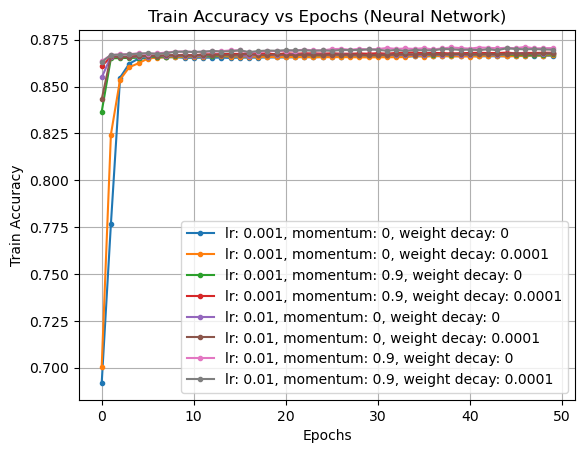

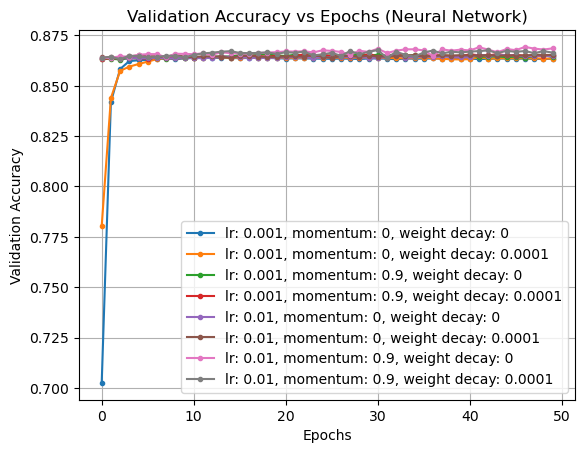

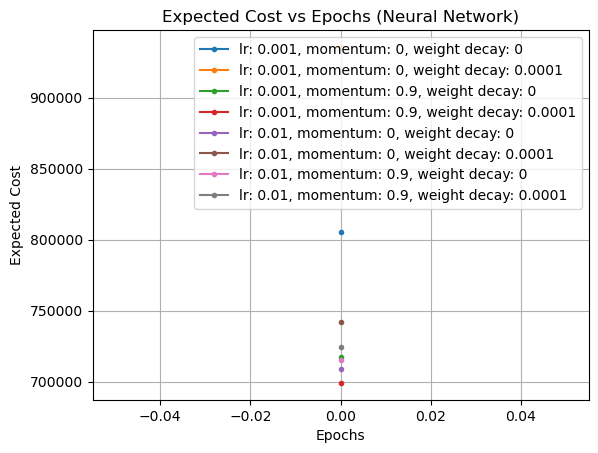

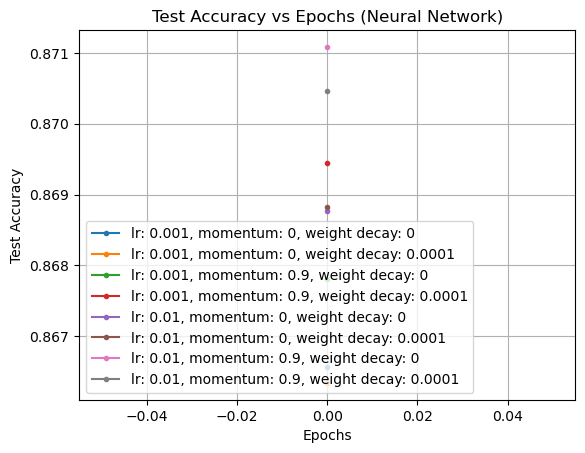

Best expected cost:  699073.8456690311
Best test accuracy:  0.8694474233786759
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0.0001
Best test accuracy:  0.8710842693458261
Best expected cost:  715434.6566865444
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001


In [16]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_nn = []
val_losses_list_nn = []
train_accuracies_list_nn = []
val_accuracies_list_nn = []
expected_costs_list_nn = []
test_accuracy_list_nn = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = NeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_nn.append(train_losses_cost_sensitive_lr)
            val_losses_list_nn.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_nn.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_nn.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_nn.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_nn.append(accuracy_score(y_test_label, y_pred))

print(min(expected_costs_list_nn))
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_nn))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_nn)
best_expected_cost_index = expected_costs_list_nn.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_nn[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_nn)
best_test_accuracy_index = test_accuracy_list_nn.index(best_test_accuracy)
best_expected_cost = expected_costs_list_nn[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


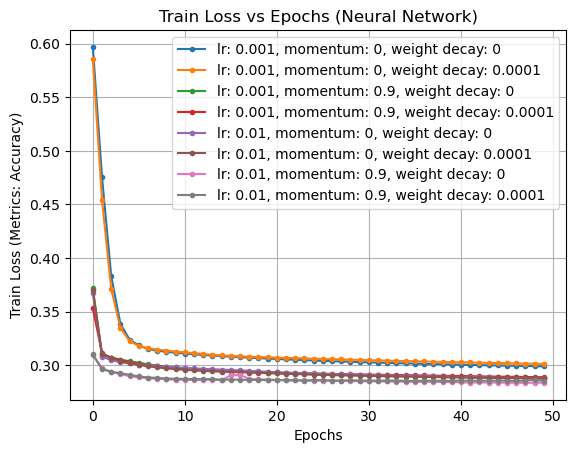

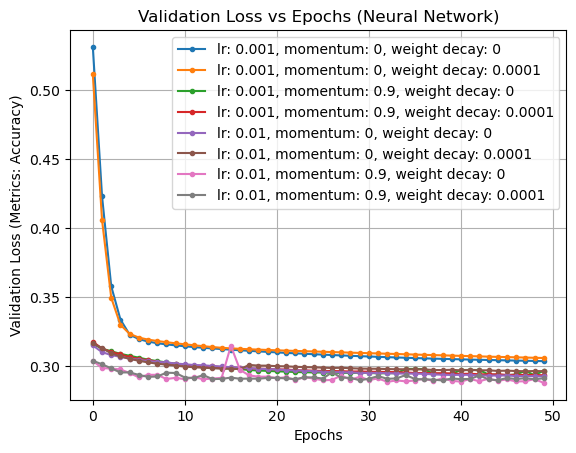

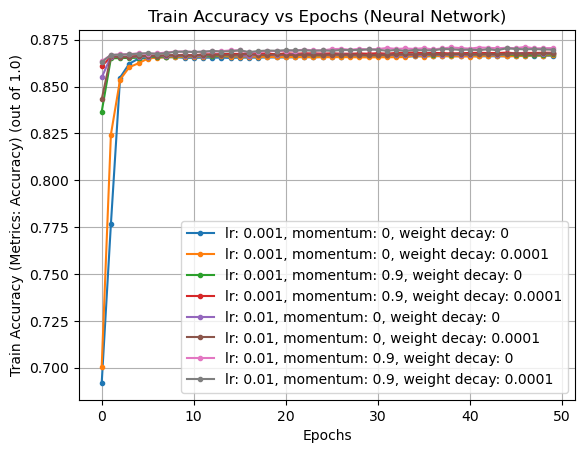

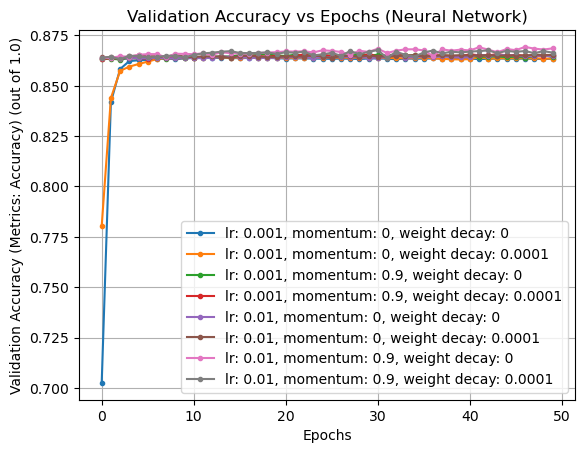

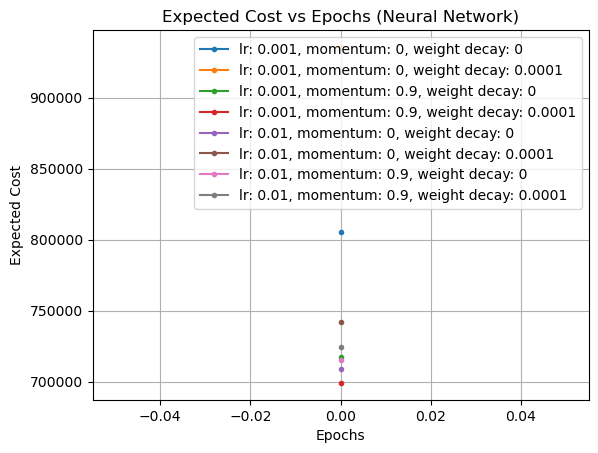

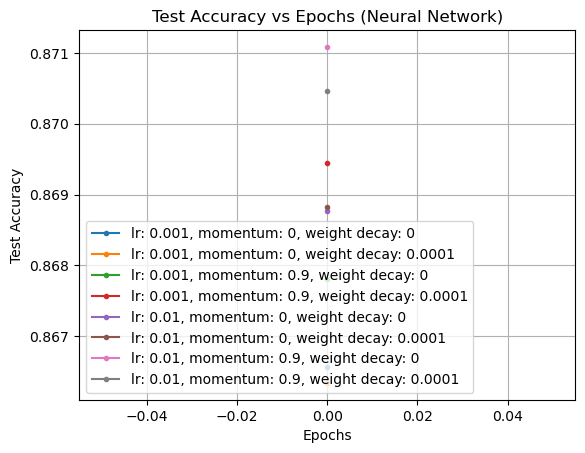

In [50]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Accuracy)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Accuracy)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Accuracy) (out of 1.0)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Accuracy) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 0.580575 	Training Accuracy: 0.688538 	Validation Loss: 0.481423 	Validation Accuracy: 0.815647
Epoch: 2 	Training Loss: 0.422250 	Training Accuracy: 0.849049 	Validation Loss: 0.377881 	Validation Accuracy: 0.858885
Epoch: 3 	Training Loss: 0.349260 	Training Accuracy: 0.863564 	Validation Loss: 0.334950 	Validation Accuracy: 0.863325
Epoch: 4 	Training Loss: 0.323812 	Training Accuracy: 0.865702 	Validation Loss: 0.322929 	Validation Accuracy: 0.864793
Epoch: 5 	Training Loss: 0.316737 	Training Accuracy: 0.865644 	Validation Loss: 0.319624 	Validation Accuracy: 0.864605
Epoch: 6 	Training Loss: 0.314566 	Training Accuracy: 0.865741 	Validation Loss: 0.318478 	Validation Accuracy: 0.864228
Epoch: 7 	Training Loss: 0.313651 	Training Accuracy: 0.865722 	Validation Loss: 0.317885 	Validation Accuracy: 0.864379
Epoch: 8 	Training Loss: 0.313105 	Training Accuracy: 0.865654 	Validation Loss: 0.317461 	Validation

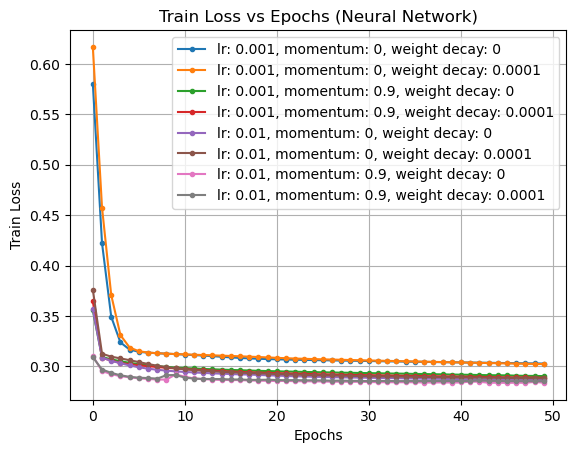

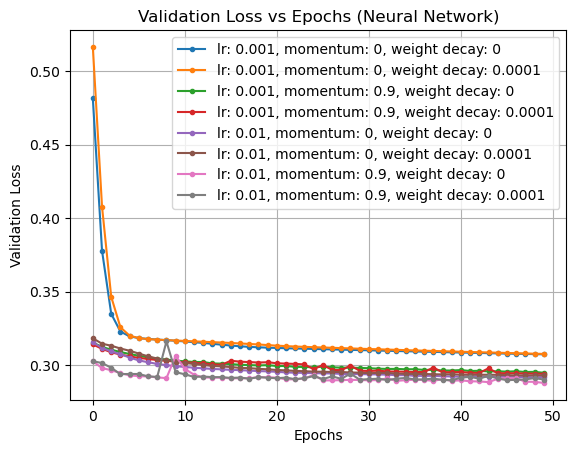

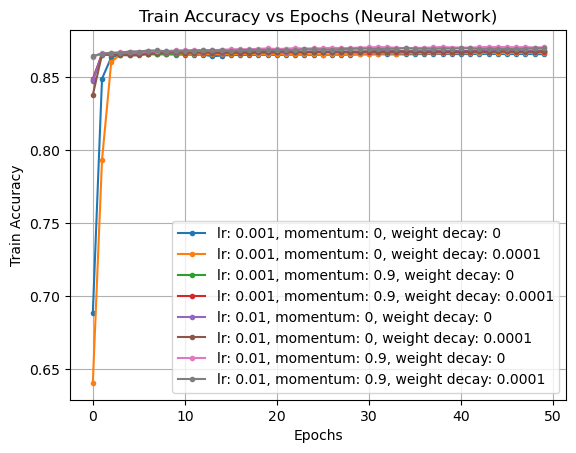

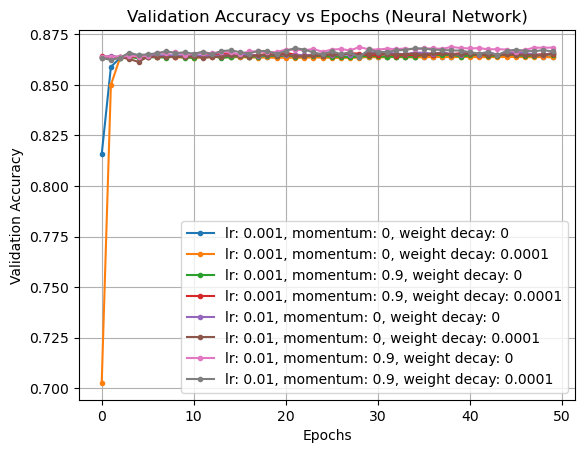

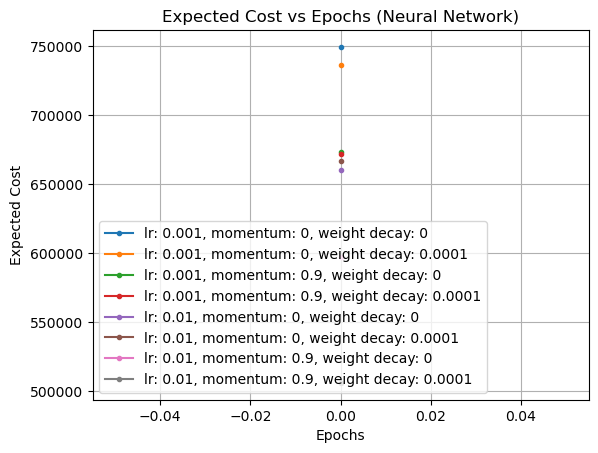

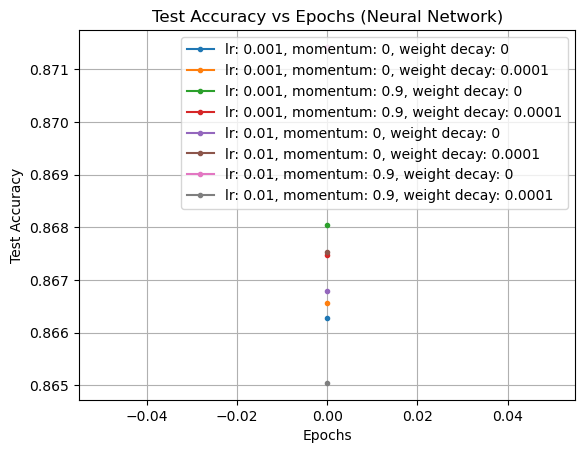

Best expected cost:  506074.1912088394
Best test accuracy:  0.8650448721566857
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001
Best test accuracy:  0.871422927132133
Best expected cost:  596864.9624192715
Best learning rate:  0.001
Best momentum:  0.9
Best weight decay:  0.0001


In [17]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_nn2 = []
val_losses_list_nn2 = []
train_accuracies_list_nn2 = []
val_accuracies_list_nn2 = []
expected_costs_list_nn2 = []
test_accuracy_list_nn2 = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = NeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model2(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_nn2.append(train_losses_cost_sensitive_lr)
            val_losses_list_nn2.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_nn2.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_nn2.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_nn2.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_nn2.append(accuracy_score(y_test_label, y_pred))

print(min(expected_costs_list_nn2))
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_nn2))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_nn2)
best_expected_cost_index = expected_costs_list_nn2.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_nn2[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_nn2)
best_test_accuracy_index = test_accuracy_list_nn2.index(best_test_accuracy)
best_expected_cost = expected_costs_list_nn2[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


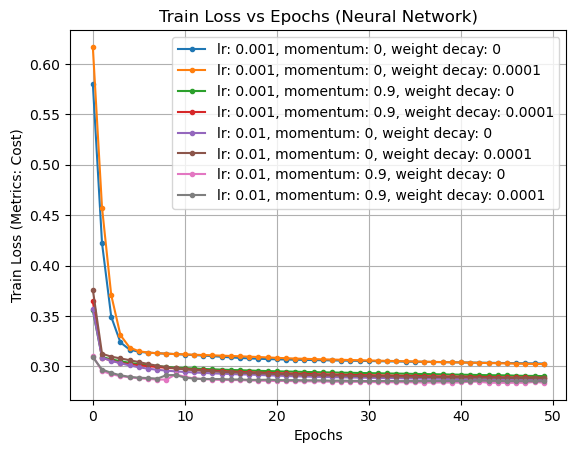

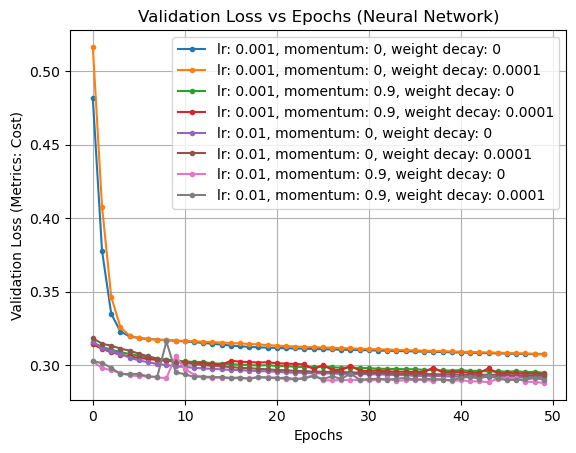

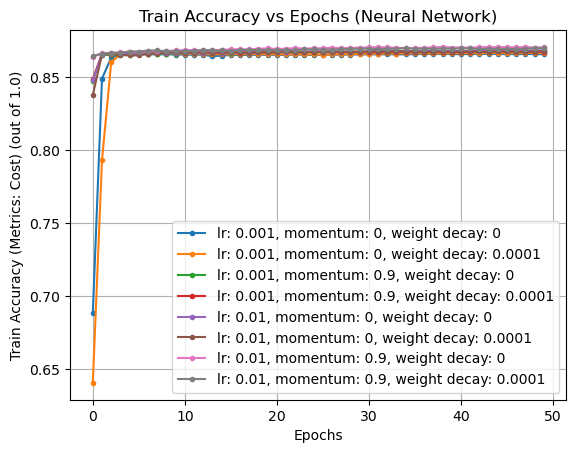

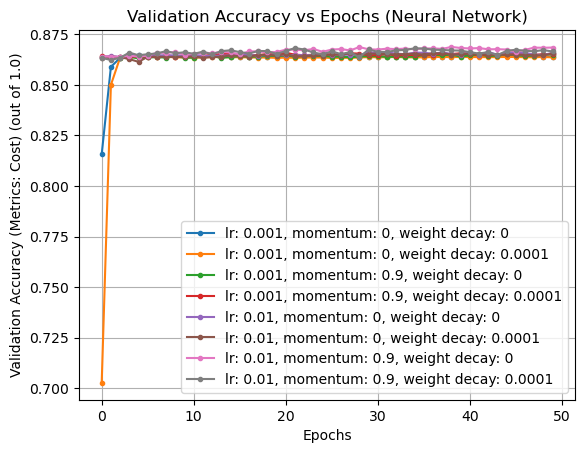

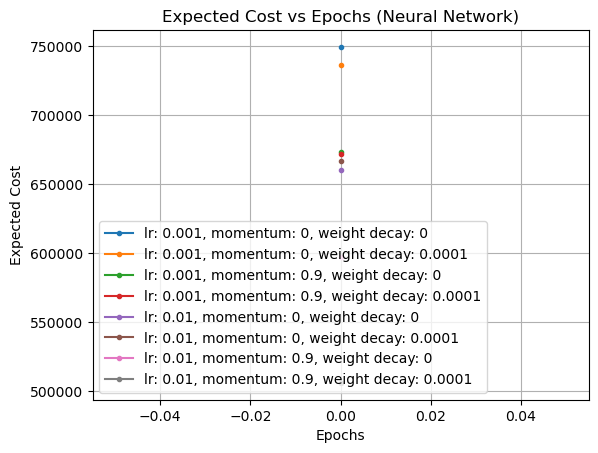

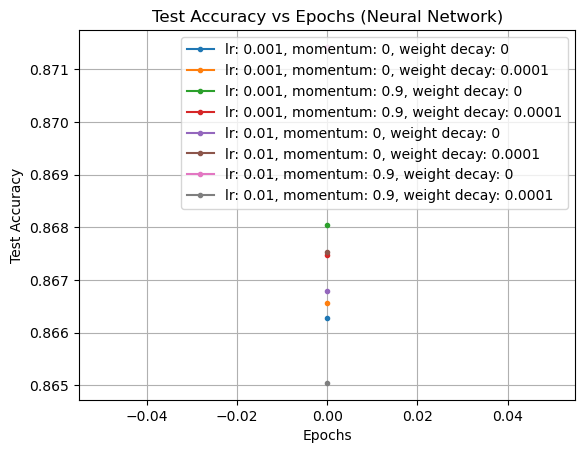

In [53]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Cost)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Cost)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

In [52]:
# neural_network_model = NeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
# return_val = neural_network_model.train_model(train_loader, val_loader, num_epochs=10, learning_rate=0.001)
# print("Cost of NN Model: ", neural_network_model.compute_expected_cost(test_loader))

# # Display confusion matrix
# y_pred = neural_network_model(X_test)
# y_pred = y_pred >= 0.5
# y_pred = y_pred.detach().numpy()
# y_pred = y_pred.astype(int)

# # select only first column of y_test
# y_test_label = []
# for i in range(len(y_test)):
#     y_test_label.append(y_test[i][0])

# # convert y_pred and y_test into list
# y_pred = y_pred.tolist()
# # y_test = y_test.tolist()
# # print precision, recall, f1 score
# print(classification_report(y_test_label, y_pred))

# # print accuracy
# print("Accuracy: ", accuracy_score(y_test_label, y_pred))

Epoch: 1 	Training Loss: 0.330601 	Training Accuracy: 0.859761 	Validation Loss: 0.304615 	Validation Accuracy: 0.865432
Epoch: 2 	Training Loss: 0.298885 	Training Accuracy: 0.865964 	Validation Loss: 0.297793 	Validation Accuracy: 0.866019
Epoch: 3 	Training Loss: 0.294928 	Training Accuracy: 0.866776 	Validation Loss: 0.295712 	Validation Accuracy: 0.866290
Epoch: 4 	Training Loss: 0.293310 	Training Accuracy: 0.866680 	Validation Loss: 0.294181 	Validation Accuracy: 0.866290
Epoch: 5 	Training Loss: 0.292167 	Training Accuracy: 0.866834 	Validation Loss: 0.294906 	Validation Accuracy: 0.866561
Epoch: 6 	Training Loss: 0.291547 	Training Accuracy: 0.867047 	Validation Loss: 0.293744 	Validation Accuracy: 0.866787
Epoch: 7 	Training Loss: 0.291053 	Training Accuracy: 0.867376 	Validation Loss: 0.293817 	Validation Accuracy: 0.867374
Epoch: 8 	Training Loss: 0.290609 	Training Accuracy: 0.867154 	Validation Loss: 0.292402 	Validation Accuracy: 0.866561
Epoch: 9 	Training Loss: 0.29013

In [18]:
# Cost Sensitive Neural Network Model
class CostSensitiveNeuralNetwork(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(CostSensitiveNeuralNetwork, self).__init__()
        # Defining the number of input nodes, hidden nodes and output nodes
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.output_dim = 1
                # Defining the layers
        self.model = nn.Sequential(
            nn.Linear(self.input_dim, self.hidden_dim),
            nn.ReLU(),
            nn.Linear(self.hidden_dim, self.output_dim),
            nn.Sigmoid()
        )
        
        self.loss_critetion = self.compute_loss
    
    def forward(self, x):
        # Forward pass through the network
        x = self.model(x)
        return x
    
    def compute_loss(self, y_pred, y_true, false_negative_cost):
        epsilon = 1e-7
        true_positive_cost = 4.0
        false_positive_cost = 4.0
        true_negative_cost = 0
        # print("False Negative Cost: ",false_negative_cost.reshape(-1,1).shape)
        
        # print("Y_pred Shape: ",y_pred.shape)
        # print("Y_true Shape: ",y_true.shape)

        # Compute the losses for true positives, false positives, true negatives, and false negatives
        # tp_loss = y_true * torch.log(y_pred + epsilon) * true_positive_cost
        # fp_loss = y_true * torch.log(1 - y_pred + epsilon) * false_positive_cost
        # tn_loss = (1 - y_true) * torch.log(1 - y_pred + epsilon) * true_negative_cost
        # fn_loss = (1 - y_true) * torch.log(y_pred + epsilon) * false_negative_cost
        
        tp_loss = y_true * y_pred * true_positive_cost
        fp_loss = (1 - y_true) * y_pred * false_positive_cost
        fn_loss = (y_true * (1 - y_pred)) * false_negative_cost.reshape(-1,1)
        # tn_loss = (1 - y_true) * (1 - y_pred) * true_negative_cost
        tn_loss = torch.multiply((1 - y_true), (1 - y_pred)) * true_negative_cost
        # print((1-y_true).shape)
        # print((1-y_pred).shape)

        # Compute the total loss
        # total_loss = y_true * (y_pred * true_positive_cost + (1 - y_pred) * false_negative_cost) + (1 - y_true) * (y_pred * false_positive_cost + (1 - y_pred) * true_negative_cost)

        # total_loss = total_loss.mean()
        total_loss = tp_loss + fp_loss + tn_loss + fn_loss
        # print(tp_loss.shape, fp_loss.shape, tn_loss.shape, fn_loss.shape)
        # print("Loss Shape: ",total_loss.shape)
        total_loss = total_loss.mean()

        return total_loss
    
    def compute_expected_cost(self, test_loader):
        # compute the expected cost for the test data
        total_cost = 0
        for batch_idx, (data, target) in enumerate(test_loader):
            output = self(data)
            false_neg_cost = target[:, 1]
            target = target[:, 0].view(-1, 1)
            loss = self.compute_loss(output, target, false_neg_cost)
            total_cost += loss.item() * data.size(0)
        return total_cost
    
    def train_model(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.compute_loss
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_accuracy = 0
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)               
            
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
            
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)

            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
            
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
        
            if test_accuracy > best_accuracy:
                best_accuracy = test_accuracy
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
                
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_accuracy, best_model
      
    def train_model2(self, train_loader, test_loader, optimizer, num_epochs, learning_rate):
        # Define the loss function and the optimizer
        criterion = self.compute_loss
        # optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        
        self.train()

        # Lists to keep track of progress
        train_losses = []
        test_losses = []
        test_accuracies = []
        train_accuracies = []
        best_expected_cost = float('inf')
        best_model = None

        # Number of epochs
        n_epochs = num_epochs

        for epoch in range(n_epochs):
            # Monitor training loss
            train_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.train()
            for batch_idx, (data, target) in enumerate(train_loader):
                # Clear the gradients of all optimized variables
                optimizer.zero_grad()
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Backward pass: compute gradient of the loss with respect to model parameters
                loss.backward()
                # Perform a single optimization step (parameter update)
                optimizer.step()
                # Update running training loss
                train_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)               
            
            # Calculate average loss over an epoch
            train_loss = train_loss / len(train_loader.dataset)
            
            # Calculate training accuracy
            train_accuracy = correct_classified / total_classified
        
            # Append to the training loss and accuracy lists
            train_accuracies.append(train_accuracy)
            train_losses.append(train_loss)

            # Test the model for validation
            test_loss = 0.0
            total_classified = 0
            correct_classified = 0
            self.eval()
            for batch_idx, (data, target) in enumerate(test_loader):
                # Forward pass: compute predicted outputs by passing inputs to the model
                output = self(data)
                false_neg_cost = target[:, 1]
                target = target[:, 0].view(-1, 1)
                # Calculate the batch loss
                loss = criterion(output, target, false_neg_cost)
                # Update running validation loss 
                test_loss += loss.item() * data.size(0)
                # Calculate the number of correct classifications
                pred = output >= 0.5
                correct_classified += (pred == target).sum().item()
                total_classified += len(target)
        
            # Calculate average loss over an epoch
            test_loss = test_loss / len(test_loader.dataset)
        
            # Calculate validation accuracy
            test_accuracy = correct_classified / total_classified
            
            # Append to the validation loss and accuracy lists
            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)
            best_expected_cost = self.compute_expected_cost(test_loader)
        
            # print both test and train loss and accuracy
            print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss, train_accuracy, test_loss, test_accuracy))
        
            if test_accuracy > best_expected_cost:
                best_expected_cost = test_accuracy
                # best_model = self.state_dict()
                # torch.save(best_model, 'best_model.pt')
                torch.save(self.state_dict(), 'best_model.pt')
                
        # print('Best Accuracy: ', best_accuracy)
        # Load the best model
        self.load_state_dict(torch.load('best_model.pt'))
        return train_losses, test_losses, train_accuracies, test_accuracies, best_expected_cost, best_model
      

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 3.898343 	Training Accuracy: 0.384537 	Validation Loss: 3.239962 	Validation Accuracy: 0.578573
Epoch: 2 	Training Loss: 2.942023 	Training Accuracy: 0.630964 	Validation Loss: 2.790344 	Validation Accuracy: 0.652856
Epoch: 3 	Training Loss: 2.734697 	Training Accuracy: 0.655542 	Validation Loss: 2.712570 	Validation Accuracy: 0.658689
Epoch: 4 	Training Loss: 2.682534 	Training Accuracy: 0.659509 	Validation Loss: 2.682442 	Validation Accuracy: 0.658049
Epoch: 5 	Training Loss: 2.657840 	Training Accuracy: 0.659858 	Validation Loss: 2.665813 	Validation Accuracy: 0.659667
Epoch: 6 	Training Loss: 2.642375 	Training Accuracy: 0.661474 	Validation Loss: 2.655014 	Validation Accuracy: 0.660533
Epoch: 7 	Training Loss: 2.631410 	Training Accuracy: 0.663719 	Validation Loss: 2.646973 	Validation Accuracy: 0.659780
Epoch: 8 	Training Loss: 2.623496 	Training Accuracy: 0.662287 	Validation Loss: 2.641366 	Validation

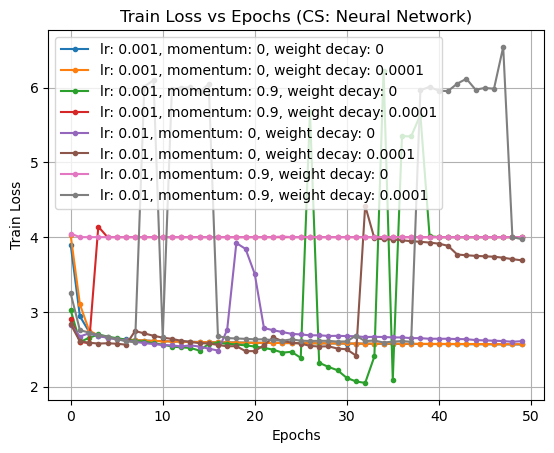

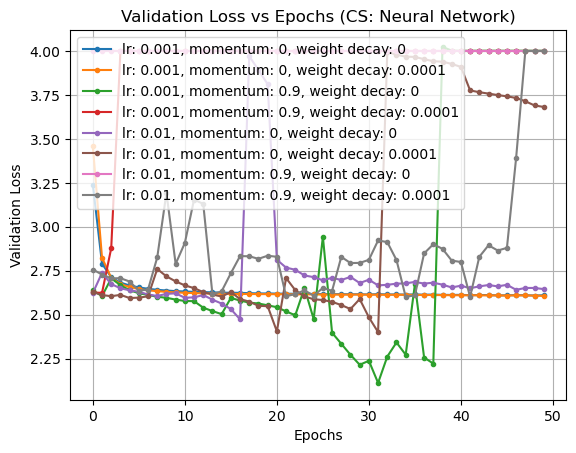

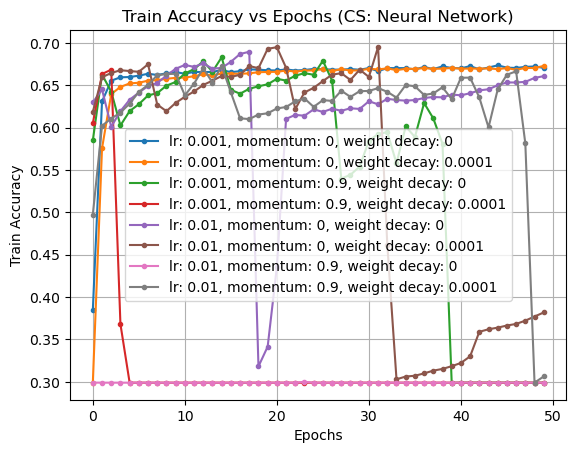

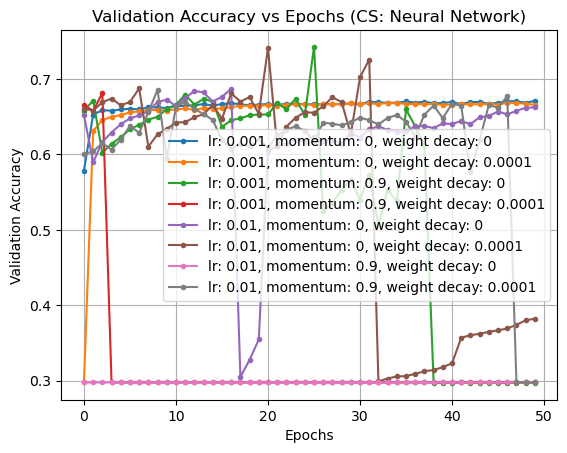

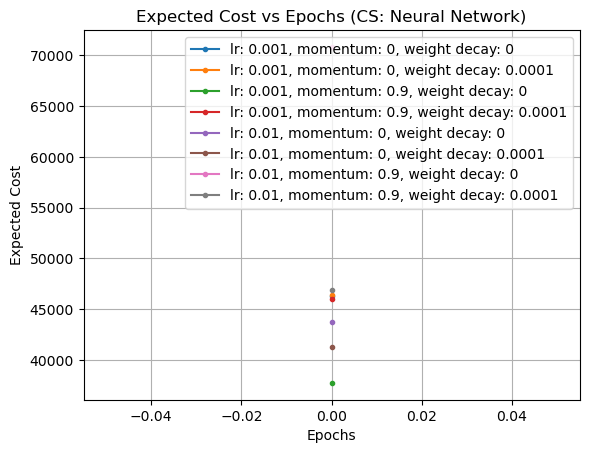

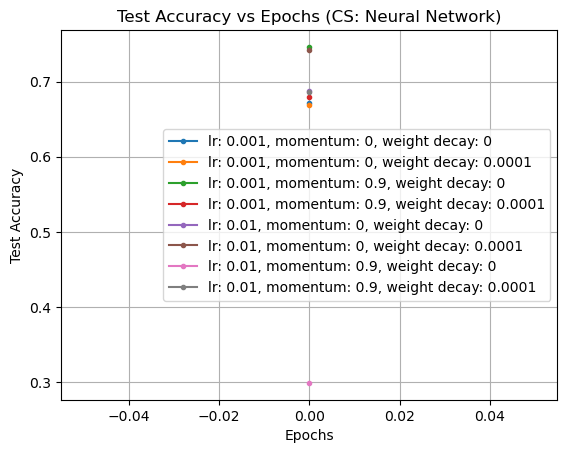

Best expected cost:  37742.57880830765
Best test accuracy:  0.7464017610204888
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0.0001
Best test accuracy:  0.7464017610204888
Best expected cost:  37742.57880830765
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0.0001


In [19]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_nn_cs = []
val_losses_list_nn_cs = []
train_accuracies_list_nn_cs = []
val_accuracies_list_nn_cs = []
expected_costs_list_nn_cs = []
test_accuracy_list_nn_cs = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = CostSensitiveNeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_nn_cs.append(train_losses_cost_sensitive_lr)
            val_losses_list_nn_cs.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_nn_cs.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_nn_cs.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_nn_cs.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_nn_cs.append(accuracy_score(y_test_label, y_pred))

print(min(expected_costs_list_nn_cs))
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_nn_cs))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn_cs[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_nn_cs)
best_expected_cost_index = expected_costs_list_nn_cs.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_nn_cs[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_nn_cs)
best_test_accuracy_index = test_accuracy_list_nn_cs.index(best_test_accuracy)
best_expected_cost = expected_costs_list_nn_cs[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


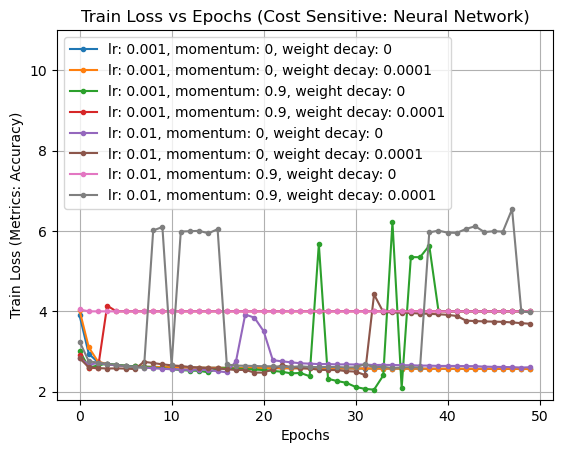

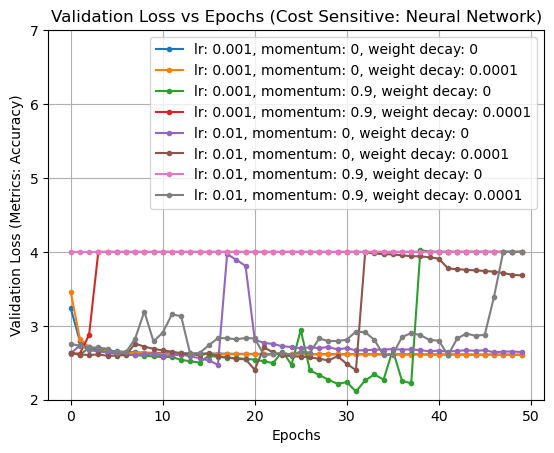

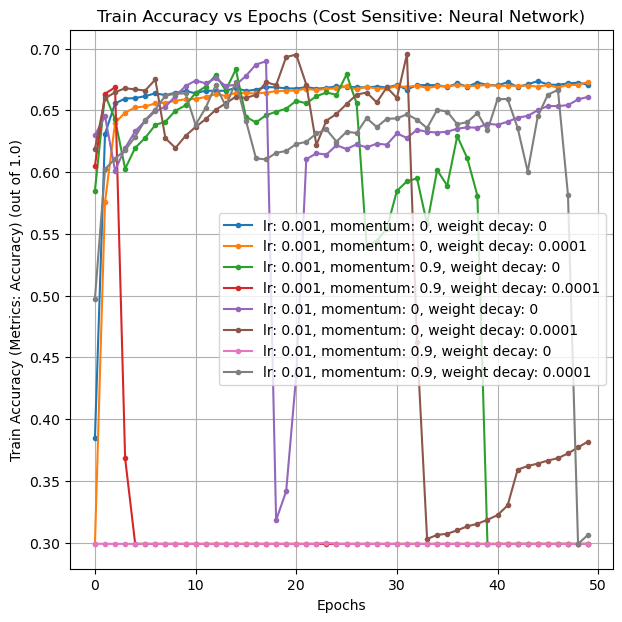

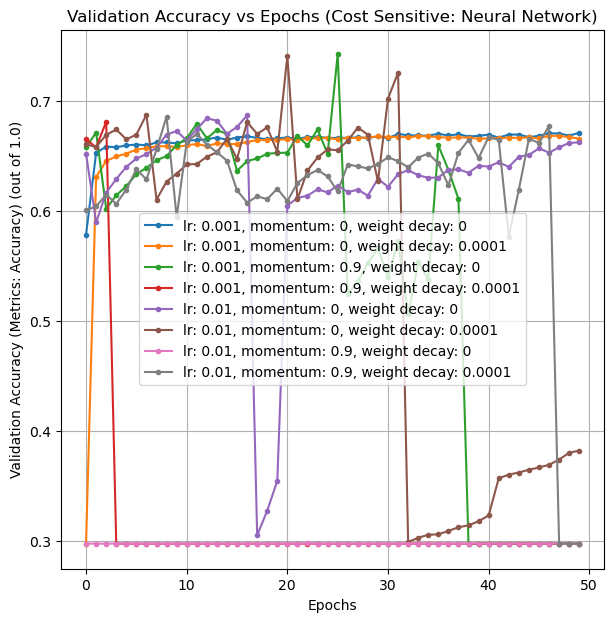

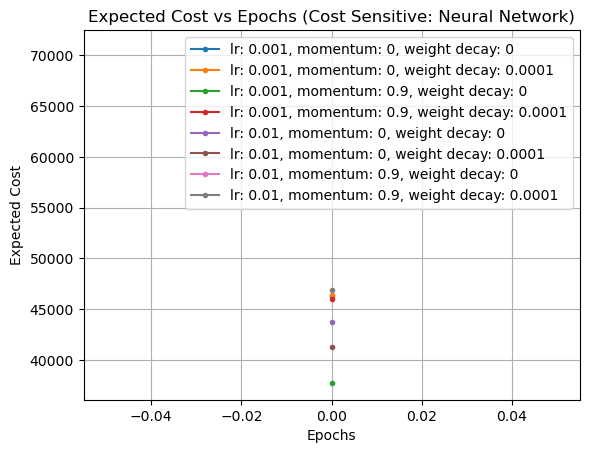

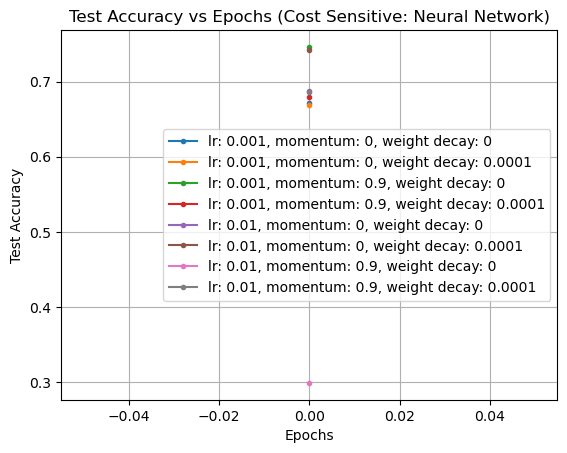

In [72]:
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn_cs[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend(loc='upper left')
plt.title("Train Loss vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Accuracy)")
plt.ylim(1.8, 11)
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Accuracy)")
plt.ylim(2, 7)
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure(figsize=(7,7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend(loc='center right')
plt.title("Train Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Accuracy) (out of 1.0)")
# plt.ylim(0.2, 1.0)
plt.show()

plt.figure(figsize=(7,7))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend(loc='center')
plt.title("Validation Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy (Metrics: Accuracy) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()


In [20]:
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             print(i*4 + j*2 + k, i, j, k)
#             plt.plot(train_losses_list_nn_cs[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Loss vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Train Loss (Metrics : Accuracy)")
# plt.ylim(1.8, 12)
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_losses_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Loss vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Loss (Metrics : Accuracy)")
# plt.ylim(1.8, 6.5)
# plt.show()

# # plot train and validation accuracy for each hyperparameter combination

# # Multiply by 100 to get accuracy in percentage
# # train_accuracies_list_nn_cs = [np.array(train_accuracies_list_nn_cs[i])*100 for i in range(len(train_accuracies_list_nn_cs))]

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(train_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Train Accuracy vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Train Accuracy (in %) (Metrics : Accuracy)")
# # plt.ylim(28,120)
# plt.show()

# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(val_accuracies_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Validation Accuracy vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Validation Accuracy (in %) (Metrics : Accuracy)")
# plt.show()

# # plot expected cost for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(expected_costs_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Expected Cost vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Expected Cost")
# plt.show()

# # plot test accuracy for each hyperparameter combination
# plt.figure()
# plt.grid()
# for i in range(len(lr_values)):
#     for j in range(len(momentum_values)):
#         for k in range(len(weight_decay_values)):
#             plt.plot(test_accuracy_list_nn_cs[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
# plt.legend()
# plt.title("Test Accuracy vs Epochs (CS: Neural Network)")
# plt.xlabel("Epochs")
# plt.ylabel("Test Accuracy")
# plt.show()

Learning Rate:  0.001
Momentum:  0
Weight Decay:  0
Epoch: 1 	Training Loss: 3.665932 	Training Accuracy: 0.489264 	Validation Loss: 2.956851 	Validation Accuracy: 0.625009
Epoch: 2 	Training Loss: 2.807499 	Training Accuracy: 0.643592 	Validation Loss: 2.743707 	Validation Accuracy: 0.654286
Epoch: 3 	Training Loss: 2.699414 	Training Accuracy: 0.655745 	Validation Loss: 2.691604 	Validation Accuracy: 0.659818
Epoch: 4 	Training Loss: 2.662362 	Training Accuracy: 0.661261 	Validation Loss: 2.668076 	Validation Accuracy: 0.658388
Epoch: 5 	Training Loss: 2.643302 	Training Accuracy: 0.660177 	Validation Loss: 2.654806 	Validation Accuracy: 0.662151
Epoch: 6 	Training Loss: 2.631352 	Training Accuracy: 0.663690 	Validation Loss: 2.645474 	Validation Accuracy: 0.661060
Epoch: 7 	Training Loss: 2.622559 	Training Accuracy: 0.663370 	Validation Loss: 2.639177 	Validation Accuracy: 0.661850
Epoch: 8 	Training Loss: 2.616291 	Training Accuracy: 0.664444 	Validation Loss: 2.634478 	Validation

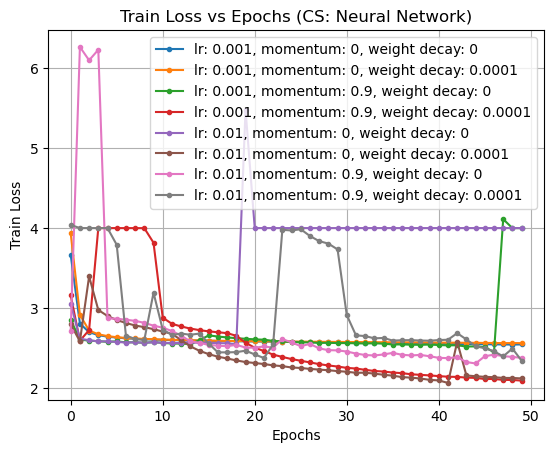

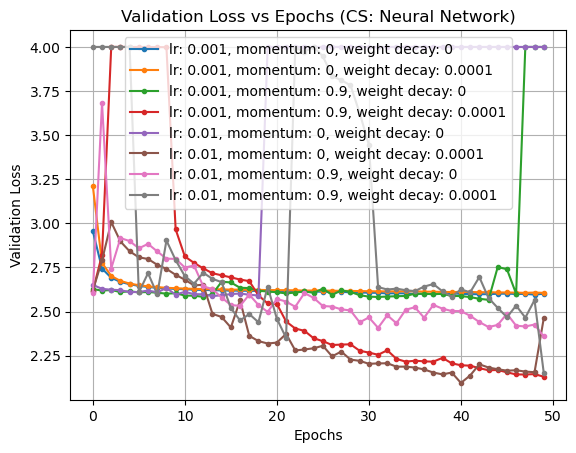

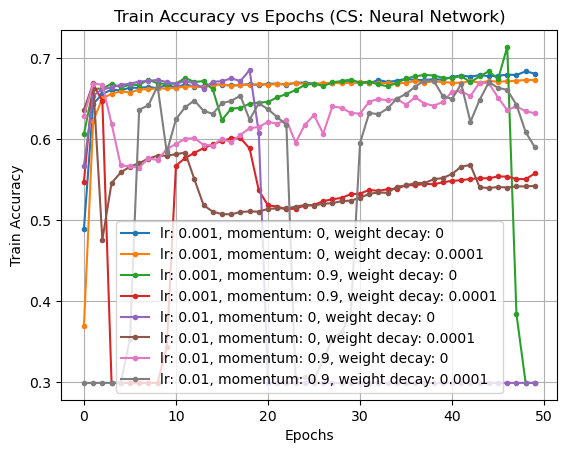

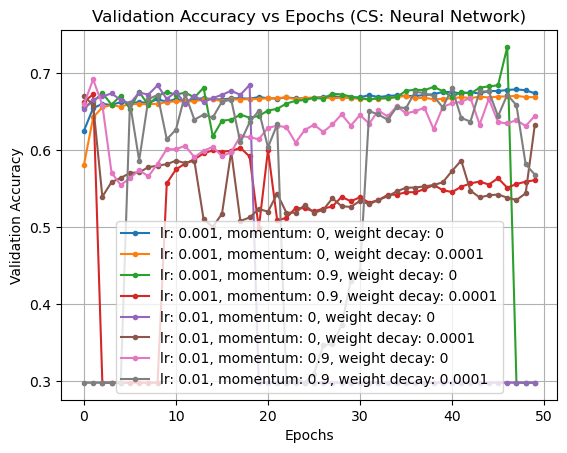

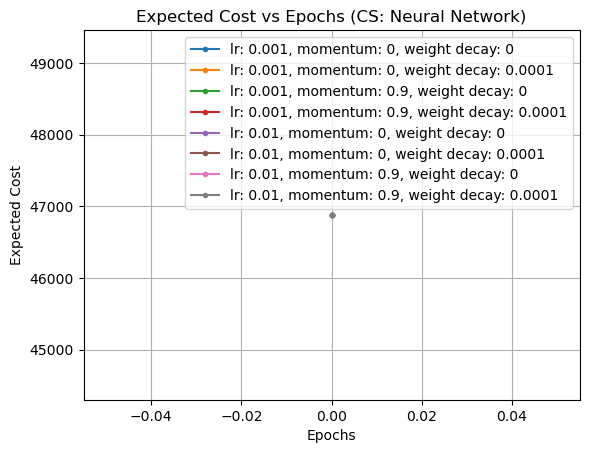

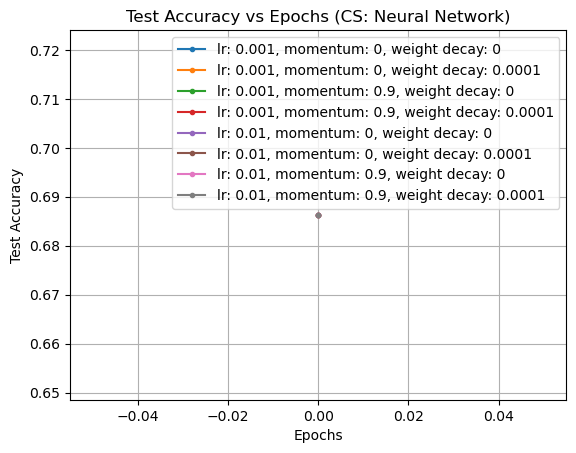

Best expected cost:  46879.41497564316
Best test accuracy:  0.6862900039510075
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0
Best test accuracy:  0.6862900039510075
Best expected cost:  46879.41497564316
Best learning rate:  0.001
Best momentum:  0
Best weight decay:  0


In [21]:
# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

train_losses_list_nn_cs2 = []
val_losses_list_nn_cs2 = []
train_accuracies_list_nn_cs2 = []
val_accuracies_list_nn_cs2 = []
expected_costs_list_nn_cs2 = []
test_accuracy_list_nn_cs2 = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            print("Learning Rate: ", lr)
            print("Momentum: ", momentum)
            print("Weight Decay: ", weight_decay)
            cost_sensitive_log_model = CostSensitiveNeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
            
            optimizer = torch.optim.SGD(cost_sensitive_log_model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
            
            return_val = cost_sensitive_log_model.train_model2(train_loader, val_loader, optimizer=optimizer, num_epochs=50, learning_rate=lr)
            train_losses_cost_sensitive_lr, val_losses_cost_sensitive_lr, train_accuracies_cost_sensitive_lr, val_accuracies_cost_sensitive_lr, best_accuracy_cost_sensitive_lr, best_model_cost_sensitive_lr = return_val
            
            train_losses_list_nn_cs2.append(train_losses_cost_sensitive_lr)
            val_losses_list_nn_cs2.append(val_losses_cost_sensitive_lr)
            train_accuracies_list_nn_cs2.append(train_accuracies_cost_sensitive_lr)
            val_accuracies_list_nn_cs2.append(val_accuracies_cost_sensitive_lr)
            expected_costs_list_nn_cs2.append(cost_sensitive_log_model.compute_expected_cost(test_loader))
            y_pred = cost_sensitive_log_model(X_test)
            y_pred = y_pred >= 0.5
            y_pred = y_pred.detach().numpy()
            y_pred = y_pred.astype(int)
            y_pred = y_pred.tolist()
            test_accuracy_list_nn_cs2.append(accuracy_score(y_test_label, y_pred))

print(min(expected_costs_list_nn_cs2))
# plot train and validation loss for each hyperparameter combination
print(len(train_losses_list_nn_cs2))
# plt.figure(figsize=(20, 10))
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn_cs2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy")
plt.show()

plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Accuracy")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (CS: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

# Print best expected cost and its accuracy and the model hyperparameters
best_expected_cost = min(expected_costs_list_nn_cs2)
best_expected_cost_index = expected_costs_list_nn_cs2.index(best_expected_cost)
best_test_accuracy = test_accuracy_list_nn_cs2[best_expected_cost_index]
best_lr = lr_values[best_expected_cost_index // 8]
best_momentum = momentum_values[(best_expected_cost_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_expected_cost_index % 4) // 2]
print("Best expected cost: ", best_expected_cost)
print("Best test accuracy: ", best_test_accuracy)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

# Print best accuracy and its expected cost and the model hyperparameters
best_test_accuracy = max(test_accuracy_list_nn_cs2)
best_test_accuracy_index = test_accuracy_list_nn_cs2.index(best_test_accuracy)
best_expected_cost = expected_costs_list_nn_cs2[best_test_accuracy_index]
best_lr = lr_values[best_test_accuracy_index // 8]
best_momentum = momentum_values[(best_test_accuracy_index % 8) // 4]
best_weight_decay = weight_decay_values[(best_test_accuracy_index % 4) // 2]
print("Best test accuracy: ", best_test_accuracy)
print("Best expected cost: ", best_expected_cost)
print("Best learning rate: ", best_lr)
print("Best momentum: ", best_momentum)
print("Best weight decay: ", best_weight_decay)

0 0 0 0
1 0 0 1
2 0 1 0
3 0 1 1
4 1 0 0
5 1 0 1
6 1 1 0
7 1 1 1


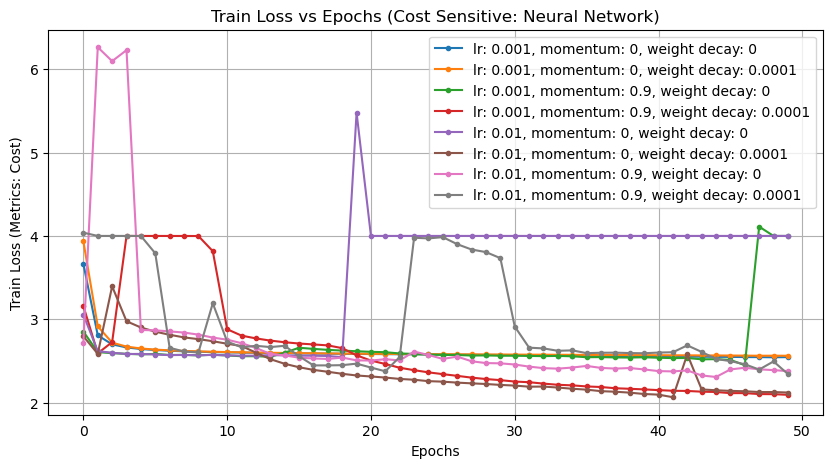

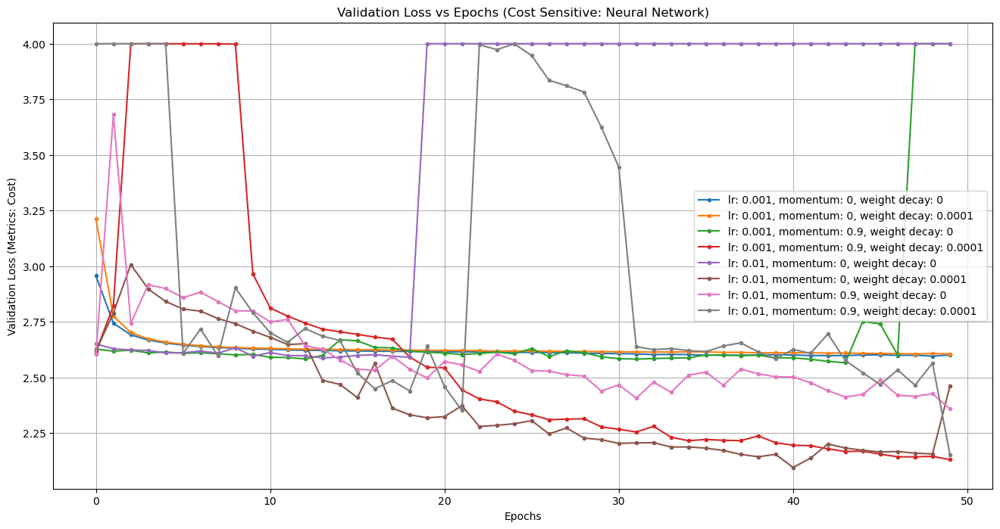

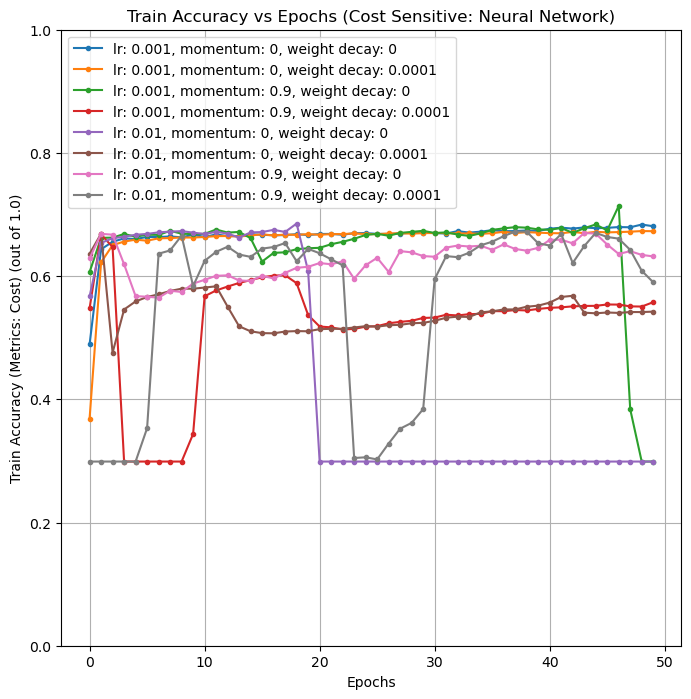

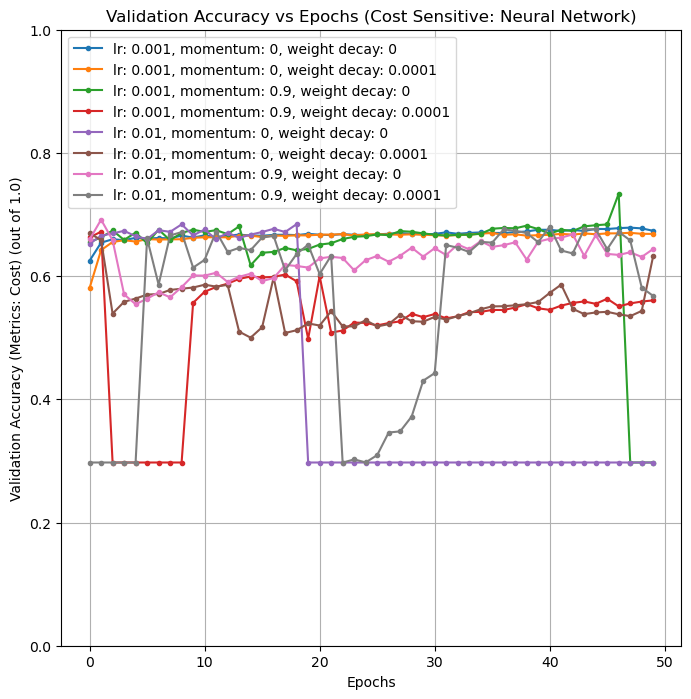

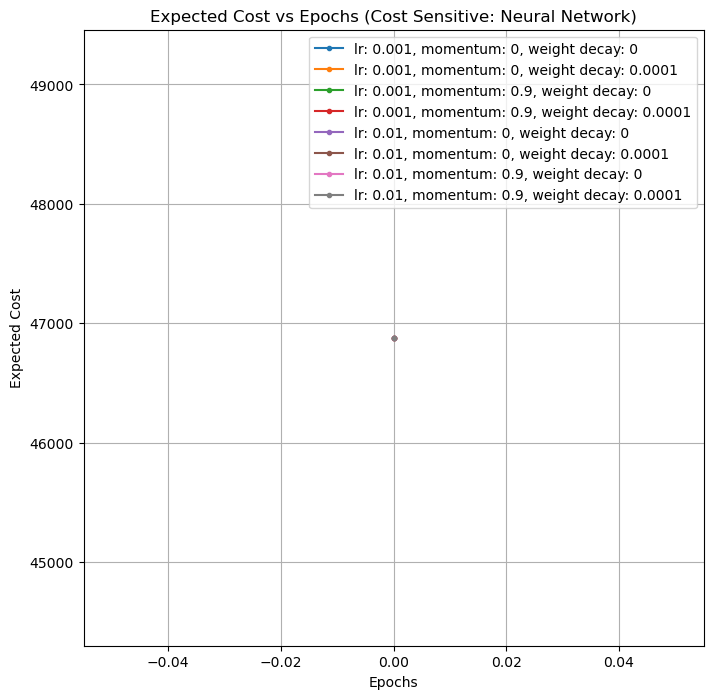

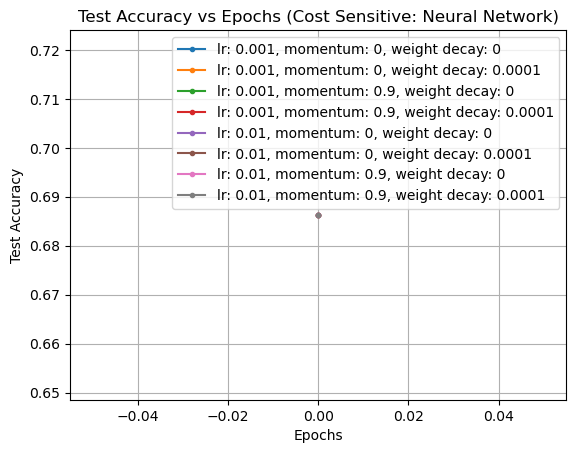

In [86]:
plt.figure(figsize=(10,5))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            print(i*4 + j*2 + k, i, j, k)
            plt.plot(train_losses_list_nn_cs2[i*4 + j*2 + k], marker='.' ,label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Loss vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Loss (Metrics: Cost)")
plt.show()

plt.figure(figsize=(16,8))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_losses_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Loss vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Validation Loss (Metrics: Cost)")
plt.show()

# plot train and validation accuracy for each hyperparameter combination
plt.figure(figsize=(8,8))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(train_accuracies_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Train Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Train Accuracy (Metrics: Cost) (out of 1.0)")
plt.ylim(0.0, 1.0)
plt.show()

plt.figure(figsize=(8,8))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(val_accuracies_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Validation Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylim(0.0, 1.0)
plt.ylabel("Validation Accuracy (Metrics: Cost) (out of 1.0)")
plt.show()

# plot expected cost for each hyperparameter combination
plt.figure(figsize=(8,8))
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(expected_costs_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Expected Cost vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Expected Cost")
plt.show()

# plot test accuracy for each hyperparameter combination
plt.figure()
plt.grid()
for i in range(len(lr_values)):
    for j in range(len(momentum_values)):
        for k in range(len(weight_decay_values)):
            plt.plot(test_accuracy_list_nn_cs2[i*4 + j*2 + k], marker='.' , label="lr: " + str(lr_values[i]) + ", momentum: " + str(momentum_values[j]) + ", weight decay: " + str(weight_decay_values[k]))
plt.legend()
plt.title("Test Accuracy vs Epochs (Cost Sensitive: Neural Network)")
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy")
plt.show()

In [53]:
cost_sensitive_nn = CostSensitiveNeuralNetwork(input_dim=X_train.shape[1], hidden_dim=20)
return_val = cost_sensitive_nn.train_model(train_loader, test_loader, num_epochs=10, learning_rate=0.001)
print("Cost of Cost Sensitive Neural Network: ", cost_sensitive_nn.compute_expected_cost(test_loader))

# Display confusion matrix
y_pred = cost_sensitive_nn(X_test)
y_pred = y_pred >= 0.5
y_pred = y_pred.detach().numpy()
y_pred = y_pred.astype(int)

# select only first column of y_test
y_test_label = []
for i in range(len(y_test)):
    y_test_label.append(y_test[i][0])

# convert y_pred and y_test into list
y_pred = y_pred.tolist()
# y_test = y_test.tolist()
# print precision, recall, f1 score
print(classification_report(y_test_label, y_pred))

# print accuracy
print("Accuracy: ", accuracy_score(y_test_label, y_pred))

Epoch: 1 	Training Loss: 9.026176 	Training Accuracy: 0.301834 	Validation Loss: 3.573717 	Validation Accuracy: 0.297074
Epoch: 2 	Training Loss: 3.477487 	Training Accuracy: 0.542465 	Validation Loss: 2.759674 	Validation Accuracy: 0.665944
Epoch: 3 	Training Loss: 2.785147 	Training Accuracy: 0.668218 	Validation Loss: 2.673012 	Validation Accuracy: 0.652036
Epoch: 4 	Training Loss: 2.644423 	Training Accuracy: 0.666496 	Validation Loss: 2.646624 	Validation Accuracy: 0.654339
Epoch: 5 	Training Loss: 2.602388 	Training Accuracy: 0.667067 	Validation Loss: 2.632211 	Validation Accuracy: 0.656371
Epoch: 6 	Training Loss: 2.578712 	Training Accuracy: 0.670182 	Validation Loss: 2.619107 	Validation Accuracy: 0.661293
Epoch: 7 	Training Loss: 2.830965 	Training Accuracy: 0.673695 	Validation Loss: 2.600717 	Validation Accuracy: 0.670821
Epoch: 8 	Training Loss: 3.058951 	Training Accuracy: 0.678369 	Validation Loss: 2.595115 	Validation Accuracy: 0.666712
Epoch: 9 	Training Loss: 2.56871

In [88]:
print(train_losses_list_cost_lr)
print(val_losses_list_cost_lr)
print(train_accuracies_list_cost_lr)
print(val_accuracies_list_cost_lr)
print(expected_costs_list_cost_lr)
print(test_accuracy_list_cost_lr)


[[4.055816624726225, 3.0253100857251822, 2.909549489873282, 2.854118028737457, 2.8197901224615936, 2.79583112643404, 2.7778297108924237, 2.7636066629311142, 2.752007843134359, 2.742281545604848, 2.7339879847384947, 2.7267740969607375, 2.720417166337594, 2.714776340973522, 2.709717957684757, 2.705149494384126, 2.700985112241693, 2.6971797248057423, 2.6936766371694, 2.69043457551113, 2.687431056141086, 2.6846350408360564, 2.682014104837695, 2.6795712825712026, 2.6772646763009944, 2.6751008881580858, 2.673048021206345, 2.671115830022011, 2.669277651296471, 2.6675339178444024, 2.6658677900770105, 2.6642861120090284, 2.662779561596285, 2.661329495592499, 2.6599469158990767, 2.6586199240804707, 2.657346705955739, 2.6561265982023845, 2.6549445951202393, 2.6538159608275724, 2.652724397598304, 2.6516763444804816, 2.650662119642698, 2.649674143997215, 2.648728029581094, 2.647808293017255, 2.646918064587417, 2.6460582543494504, 2.6452202610367643, 2.644409229226057], [4.230003032050358, 3.0184765

In [89]:

print(train_losses_list_cost_lr2)
print(val_losses_list_cost_lr2)
print(train_accuracies_list_cost_lr2)
print(val_accuracies_list_cost_lr2)
print(expected_costs_list_cost_lr2)
print(test_accuracy_list_cost_lr2)


[[3.952491279347172, 3.0093576648157, 2.9053167769614645, 2.8529514951533828, 2.8200027427846828, 2.7967694588165233, 2.7791664890087397, 2.7652194292522596, 2.75380088196731, 2.744187824895324, 2.7359678412736472, 2.728804162659558, 2.7224997930011345, 2.716880664848971, 2.7118427052600063, 2.7072736805447, 2.703107896389362, 2.6992856392834343, 2.6957782062969033, 2.692509470517037, 2.6895154363675666, 2.6866968163373977, 2.6840683686899927, 2.6815984723598993, 2.679281708514652, 2.6770892719818975, 2.6750205427856644, 2.673057706329864, 2.6712000392565183, 2.6694365687164745, 2.6677550566860284, 2.6661503405660727, 2.664617658703056, 2.6631544919115253, 2.6617521759156673, 2.660403794481917, 2.6591182232987376, 2.657868259481055, 2.6566803813332474, 2.655530959810411, 2.654423476100643, 2.6533566557159673, 2.6523218280708813, 2.6513250243941204, 2.650360137789128, 2.6494273736276304, 2.6485264067114844, 2.647649117262202, 2.646798274642676, 2.645970698648512], [4.203853436883033, 3.

In [90]:

print(train_losses_list_lr)
print(val_losses_list_lr)
print(train_accuracies_list_lr)
print(val_accuracies_list_lr)
print(expected_costs_list_lr)
print(test_accuracy_list_lr)


[[0.5091157878268249, 0.3873860647070015, 0.34782711604064964, 0.3304734390655965, 0.3215846525235102, 0.3165962175503024, 0.31363454989534173, 0.31181139280662074, 0.30983487810721283, 0.3090546048032429, 0.3085357013349235, 0.3081892105565142, 0.30795119758689055, 0.3077885262473839, 0.3076779103356543, 0.30759800240369334, 0.3075415882766838, 0.3074999711877336, 0.30746917358788717, 0.30744511177963857, 0.307427206567274, 0.30741297145374075, 0.3074009669234245, 0.30739077795378916, 0.3073817442031458, 0.30737460575750186, 0.30736727495256694, 0.3073618675835207, 0.30735404920861187, 0.3073500994495398, 0.3073448663917812, 0.3073388466860861, 0.30733314047093213, 0.3073297552130347, 0.30732525682246326, 0.3073199535074852, 0.3073150852669063, 0.3073115955044958, 0.30730690787097953, 0.30730257931961724, 0.30729796547399235, 0.30729413080575346, 0.3072908806148533, 0.30728490200857794, 0.30728269532777797, 0.3072790171046453, 0.3072751202652062, 0.30726985564292547, 0.307266915613902

In [91]:

print(train_losses_list_lr2)
print(val_losses_list_lr2)
print(train_accuracies_list_lr2)
print(val_accuracies_list_lr2)
print(expected_costs_list_lr2)
print(test_accuracy_list_lr2)


[[0.5017719585699211, 0.37944204375177376, 0.3427403916511049, 0.3269575015191295, 0.31898004468221314, 0.3145528786621544, 0.3119448225250426, 0.3103357564779225, 0.3093144490665319, 0.3086501530860631, 0.3082089459948284, 0.30791298844043874, 0.3077103168010204, 0.30757038623081584, 0.3074731573114271, 0.30740355988263773, 0.3073541304878171, 0.3073183995511837, 0.3072904885908165, 0.30727218453026145, 0.3072569120050809, 0.3072438617023468, 0.3072343639047867, 0.30722572446198193, 0.30721682880254564, 0.3072126213076718, 0.3072056074407532, 0.3072010605530986, 0.30719662630694705, 0.30719157527658, 0.3071873236301762, 0.30718299747926414, 0.3071785674673523, 0.3071742245075209, 0.30717179476191075, 0.3071679541265747, 0.3071641412783825, 0.3071610524119276, 0.30715724030947833, 0.3071552648813771, 0.3071509843594946, 0.30714800187906866, 0.3071457495357874, 0.30714220985257634, 0.307139163497363, 0.30713554267134907, 0.30713369414931985, 0.3071311467525211, 0.3071281998457067, 0.307

In [92]:

print(train_losses_list_nn)
print(val_losses_list_nn)
print(train_accuracies_list_nn)
print(val_accuracies_list_nn)
print(expected_costs_list_nn)
print(test_accuracy_list_nn)


[[0.5970467262819674, 0.47539004222091347, 0.3830247695943522, 0.33857382557274346, 0.3238572043583328, 0.3185525024037869, 0.3151594567791437, 0.3135750247063637, 0.3124759248698869, 0.3116301045944247, 0.31090440068831376, 0.3102028240156979, 0.3095897651928719, 0.30902946780379553, 0.3085222959199776, 0.3080156531147603, 0.30753957943015664, 0.30708245719224325, 0.3066409363984381, 0.3062185026350201, 0.3058131932205844, 0.30543264326644837, 0.3050709460423603, 0.30471994479737585, 0.30438686774392865, 0.3040728152741241, 0.30377149484639615, 0.30347625828385094, 0.30319231056476104, 0.30291811963794274, 0.3026655067102825, 0.3024133024053515, 0.30217185298961297, 0.30193331372170357, 0.3017017517292025, 0.3014799245299884, 0.30124988454269724, 0.3010330139999495, 0.30083129359849436, 0.30063887079606766, 0.3004529168574198, 0.30027184816782704, 0.30009579771234873, 0.29992938560304233, 0.2997666437844821, 0.29960544915848475, 0.2994476925981276, 0.29929634130965976, 0.2991406685145

In [93]:

print(train_losses_list_nn2)
print(val_losses_list_nn2)
print(train_accuracies_list_nn2)
print(val_accuracies_list_nn2)
print(expected_costs_list_nn2)
print(test_accuracy_list_nn2)


[[0.5805753908587492, 0.4222504308393982, 0.34926005084303874, 0.32381244909896567, 0.31673695659815093, 0.3145655289510781, 0.31365051935191907, 0.31310489975210487, 0.31266778230384507, 0.31222480642725775, 0.3117715249883344, 0.3112836396414025, 0.3107635086218547, 0.31019388763339006, 0.30958868434198583, 0.30898955668029365, 0.308432698667531, 0.307997847737292, 0.3076114509262444, 0.3073094624019372, 0.30707139513409415, 0.306865121743792, 0.30666495088690265, 0.3064852830846791, 0.3063216976494475, 0.306154592468959, 0.3059996514778547, 0.30584382983554953, 0.30569370431866344, 0.3055385700451733, 0.3053906055290148, 0.30523843205922735, 0.305085989819757, 0.30493686827042665, 0.30479029866286095, 0.30465869981656946, 0.3045264833530855, 0.30439134100229925, 0.304260036080385, 0.30412749985379933, 0.30399759094582696, 0.3038614595210041, 0.30372904261228184, 0.30360524593079474, 0.3034709007613481, 0.3033465070367823, 0.3032197962280074, 0.3030952624741968, 0.302974106171197, 0.

In [94]:

print(train_losses_list_nn_cs)
print(val_losses_list_nn_cs)
print(train_accuracies_list_nn_cs)
print(val_accuracies_list_nn_cs)
print(expected_costs_list_nn_cs)
print(test_accuracy_list_nn_cs)


[[3.8983425039933377, 2.942022552471317, 2.7346972658543174, 2.6825341961508284, 2.657840475029521, 2.6423748695773663, 2.6314101206950062, 2.623495903965166, 2.617334727409518, 2.6124311443544608, 2.609037862307817, 2.6057041810382358, 2.6030211111891224, 2.6004560162363703, 2.598261155905205, 2.5962563320297227, 2.5943406512610503, 2.5926644623830373, 2.5908914734521424, 2.5892522659349746, 2.5881242761026417, 2.586701715468345, 2.5855022568356416, 2.584241990903747, 2.58316476873715, 2.5819626318040934, 2.5810573072990386, 2.5798313975547567, 2.5789502042789487, 2.5778908680240753, 2.576643095478344, 2.5754900309625297, 2.5754220304701843, 2.574344966493374, 2.5738706879567568, 2.5728547528979453, 2.5725010960061363, 2.5713578813509392, 2.570882660405165, 2.570470398737434, 2.5696040665891693, 2.5690523481269816, 2.5683169487823947, 2.568024877962281, 2.567357743494085, 2.5669668895250437, 2.5660987313308543, 2.565878230775987, 2.5654287304989665, 2.564662433962522], [4.022194815763

In [95]:

print(train_losses_list_nn_cs2)
print(val_losses_list_nn_cs2)
print(train_accuracies_list_nn_cs2)
print(val_accuracies_list_nn_cs2)
print(expected_costs_list_nn_cs2)
print(test_accuracy_list_nn_cs2)

[[3.6659321996203538, 2.807498839094271, 2.699413548466821, 2.662361647035463, 2.6433018338057948, 2.631351832620487, 2.622559281969816, 2.6162912731414276, 2.610791968388045, 2.606897109623796, 2.6032780464827465, 2.600456926799477, 2.597768865549153, 2.59517485075612, 2.593551374920175, 2.591377666688772, 2.5891754061385943, 2.5877343531368697, 2.586258164623651, 2.5842876253271547, 2.5832879832189, 2.5818940856286154, 2.5804482753601308, 2.579706695444427, 2.5783888472857397, 2.577327707237265, 2.5759080638190626, 2.574410172388685, 2.5731190018859427, 2.5718638135857526, 2.5705420333718902, 2.5684383136485898, 2.566126872017973, 2.56482574443604, 2.5633715841292504, 2.5613813935842344, 2.561566415738111, 2.559098892723149, 2.558325514998028, 2.556041508963506, 2.55485573855175, 2.553817180844591, 2.5518869198483487, 2.5513717855503506, 2.549349429512919, 2.5491883419497716, 2.5465887375589413, 2.5462028223415425, 2.5441521475441866, 2.546407841383399], [3.934364362796313, 2.9162149

In [5]:
expected_costs_list_cost_lr = [47691.62681698799, 47855.78742337227, 47685.784906864166, 46781.783175468445, 50015.82965064049, 49749.29760479927, 47160.49455809593, 46747.16713118553]
test_accuracy_list_cost_lr = [0.6589151662245301, 0.6577863069368404, 0.6440142236270249, 0.6663091945588983, 0.6030366314838855, 0.6079471693853361, 0.6703730879945815, 0.6715019472822713]

expected_costs_list_cost_lr2 = [47675.19140768051, 47739.89815735817, 46697.60049557686, 46335.11318683624, 47210.1606657505, 46775.04431772232, 46941.32514286041, 46221.42545199394]
test_accuracy_list_cost_lr2=[0.6594231529039906, 0.6591409380820681, 0.6652932211999775, 0.6701473161370435, 0.6597618106902975, 0.664898120449286, 0.6628661737314444, 0.6677202686685104]

expected_costs_list_lr = [819442.0176436901, 775826.9481387138, 740987.2650566101, 743931.7667047977, 730826.3254697323, 744680.2062110901, 744447.820638895, 712546.4966104031]
test_accuracy_list_lr = [0.8674154766608342, 0.8679234633402947, 0.8675848055539876, 0.8675283625896032, 0.8670768188745273, 0.8672461477676807, 0.8681492351978326, 0.8669639329457584]

expected_costs_list_lr2 = [731256.1582710743, 734470.6171450615, 714906.9051151276, 713055.4017252922, 713228.3890078068, 716114.181835413, 623439.4506309032, 680866.6070384979]
test_accuracy_list_lr2 = [0.8675848055539876, 0.8679799063046791, 0.8676412485183722, 0.8674154766608342, 0.8677541344471411, 0.8678670203759101, 0.8666252751594514, 0.8661737314443755]

expected_costs_list_nn = [805416.2109036446, 935785.8392467499, 717556.2218513489, 699073.8456690311, 708688.9294686317, 742303.2834527493, 715434.6566865444, 724390.2588386536]
test_accuracy_list_nn = [0.8665688321950669, 0.866343060337529, 0.8678105774115257, 0.8694474233786759, 0.868770107806062, 0.8688265507704465, 0.8710842693458261, 0.8704633967375967]

expected_costs_list_nn2 = [749273.7090601921, 736401.4138183594, 672980.5575721264, 671609.859869957, 659902.4384901524, 666803.68755126, 596864.9624192715, 506074.1912088394]
test_accuracy_list_nn2 = [0.8662866173731444, 0.8665688321950669, 0.8680363492690636, 0.8674719196252187, 0.8667946040526049, 0.8675283625896032, 0.871422927132133, 0.8650448721566857]

expected_costs_list_nn_cs = [46335.044817209244, 46442.083265304565, 37742.57880830765, 45975.04239106178, 43734.64962220192, 41272.45930790901, 70820.95084190369, 46879.41497564316]
test_accuracy_list_nn_cs = [0.6710504035671954, 0.6685104701698933, 0.7464017610204888, 0.6800812778687136, 0.6882090647400801, 0.742958740193035, 0.2986397245583338, 0.6862900039510075]

expected_costs_list_nn_cs2 = [46879.41497564316, 46879.41497564316, 46879.41497564316, 46879.41497564316, 46879.41497564316, 46879.41497564316, 46879.41497564316, 46879.41497564316]
test_accuracy_list_nn_cs2 = [0.6862900039510075, 0.6862900039510075, 0.6862900039510075, 0.6862900039510075, 0.6862900039510075, 0.6862900039510075, 0.6862900039510075, 0.6862900039510075]


['(0.001, 0, 0)', '(0.001, 0, 0.0001)', '(0.001, 0.9, 0)', '(0.001, 0.9, 0.0001)', '(0.01, 0, 0)', '(0.01, 0, 0.0001)', '(0.01, 0.9, 0)', '(0.01, 0.9, 0.0001)']


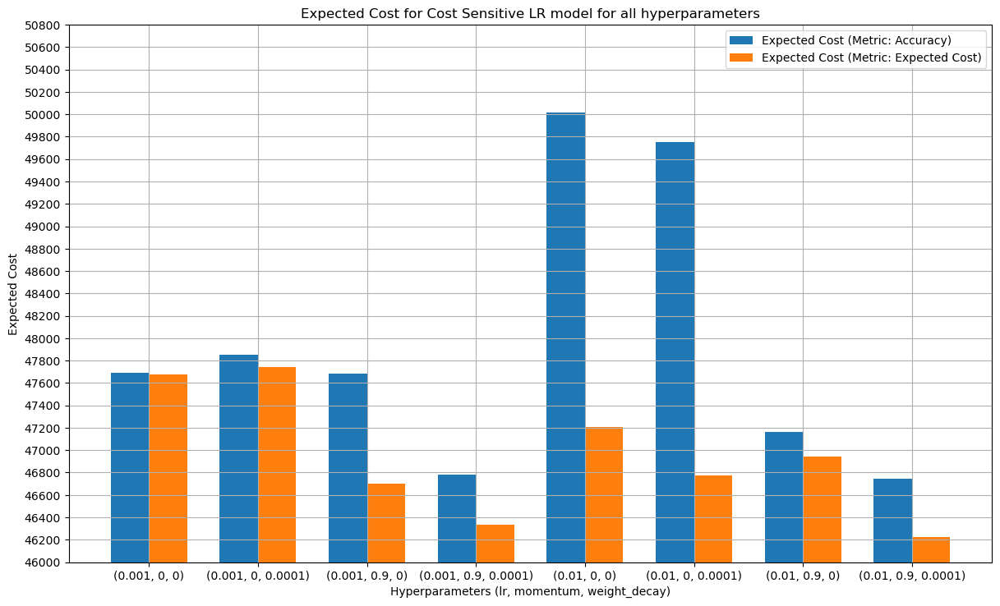

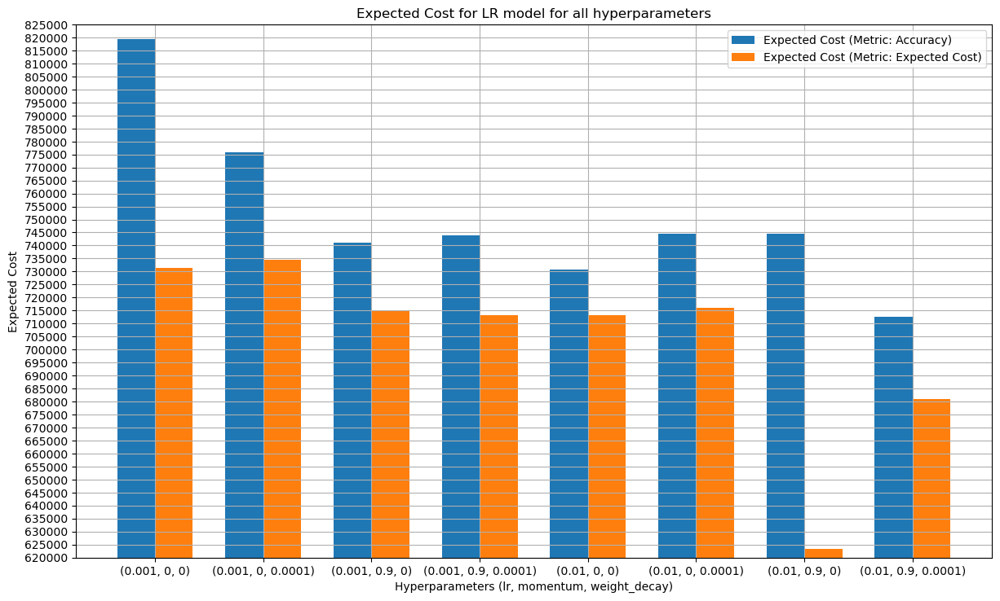

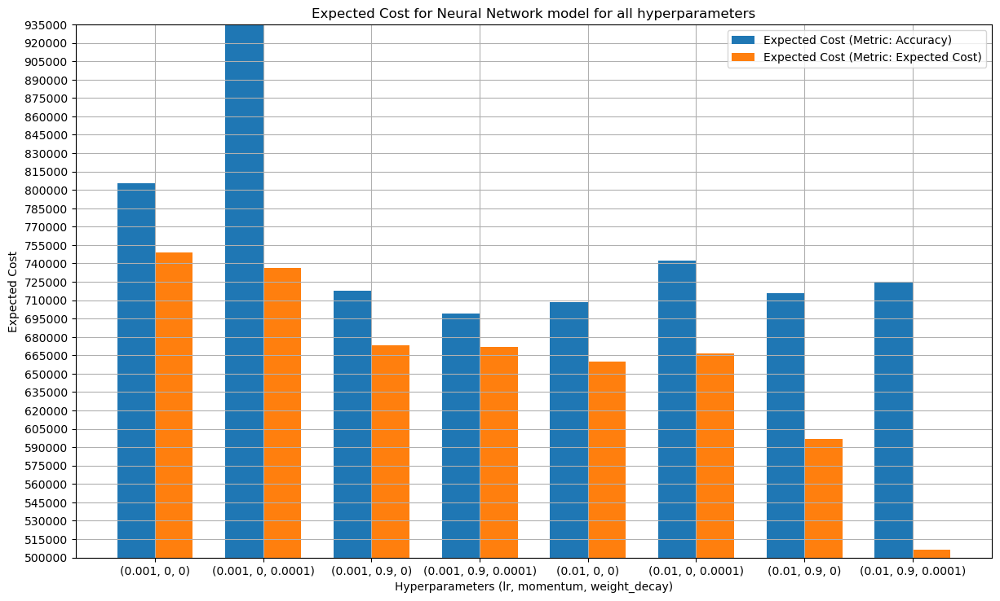

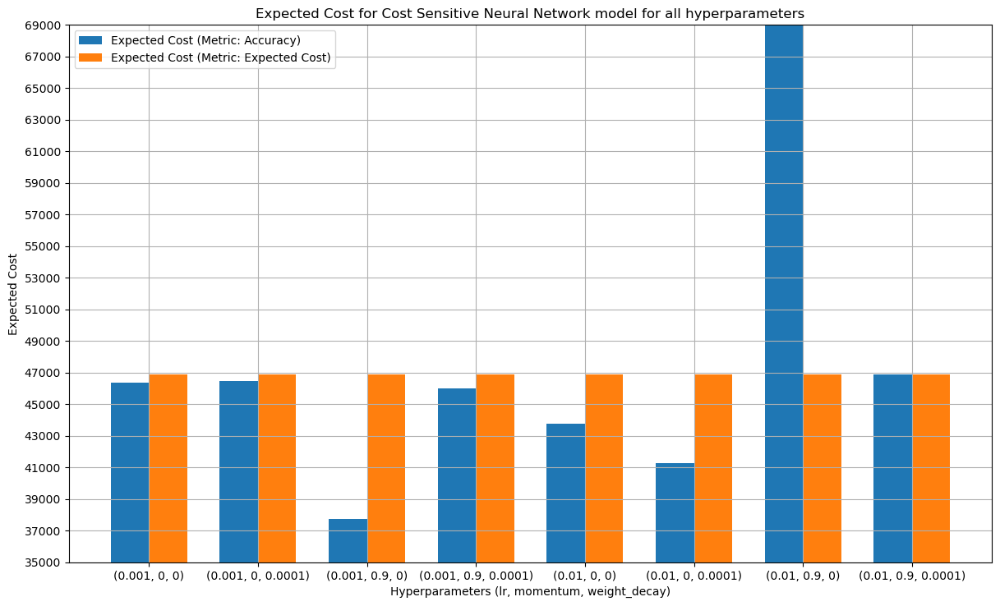

In [64]:
hyperparameters_list = []

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            hyperparameters_list.append((lr, momentum, weight_decay))

string_hyperparameters_list = [str(hyperparameters_list[i]) for i in range(len(hyperparameters_list))]
print(string_hyperparameters_list)

def plot_func(metric1, metric2, name, range):

    fig, ax = plt.subplots()
    width = 0.35
    ax.bar(string_hyperparameters_list, metric1, width, label='Expected Cost (Metric: Accuracy)')
    ax.bar(np.arange(len(string_hyperparameters_list)) + width, metric2, width, label='Expected Cost (Metric: Expected Cost)')

    ax.legend()
    ax.set_xlabel('Hyperparameters (lr, momentum, weight_decay)')
    ax.set_ylabel('Expected Cost')
    ax.set_title(f'Expected Cost for {name} model for all hyperparameters')
    ax.set_yticks(range)
    ax.set_xticks(np.arange(len(string_hyperparameters_list)) + width/2)
    fig.set_size_inches(14.5, 8.5)
    ax.set_ylim(range[0], range[-1])
    ax.grid()
    plt.show()
    
plot_func(expected_costs_list_cost_lr, expected_costs_list_cost_lr2, 'Cost Sensitive LR', np.arange(46000, 51000, 200))
plot_func(expected_costs_list_lr, expected_costs_list_lr2, 'LR', np.arange(620000, 830000, 5000))
plot_func(expected_costs_list_nn, expected_costs_list_nn2, 'Neural Network', np.arange(500000, 950000, 15000))
plot_func(expected_costs_list_nn_cs, expected_costs_list_nn_cs2, 'Cost Sensitive Neural Network', np.arange(35000, 71000, 2000))

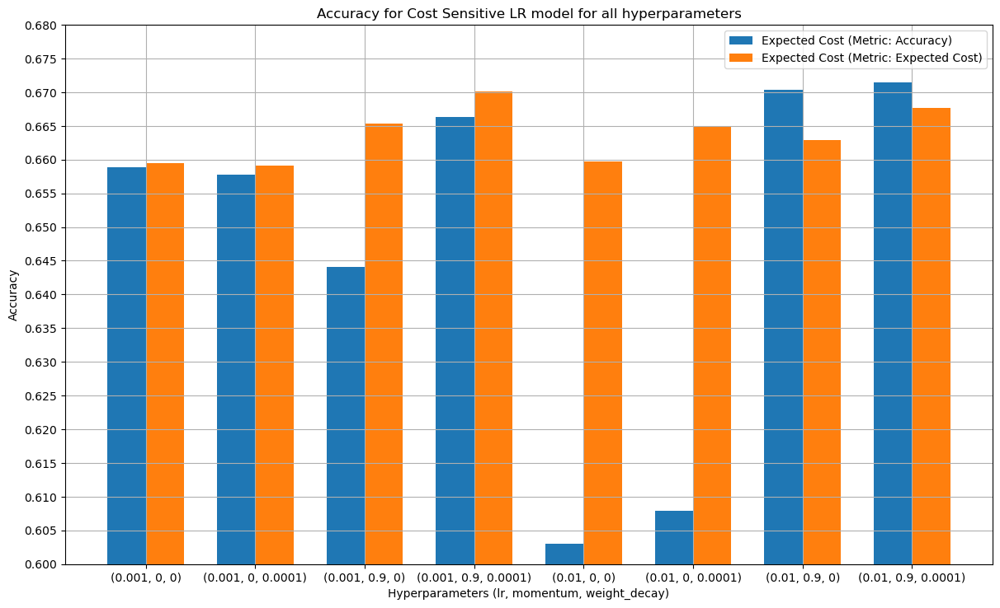

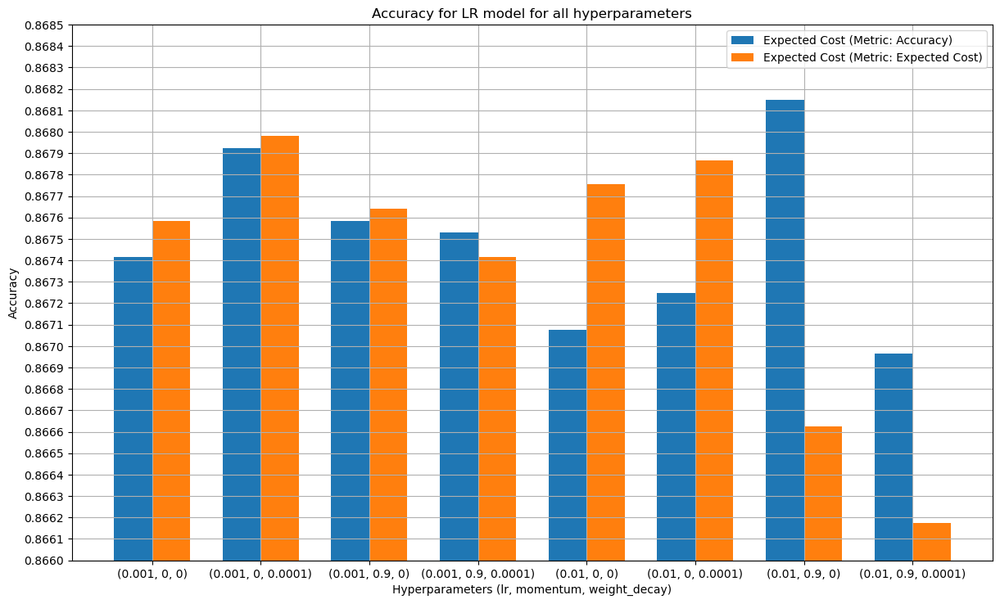

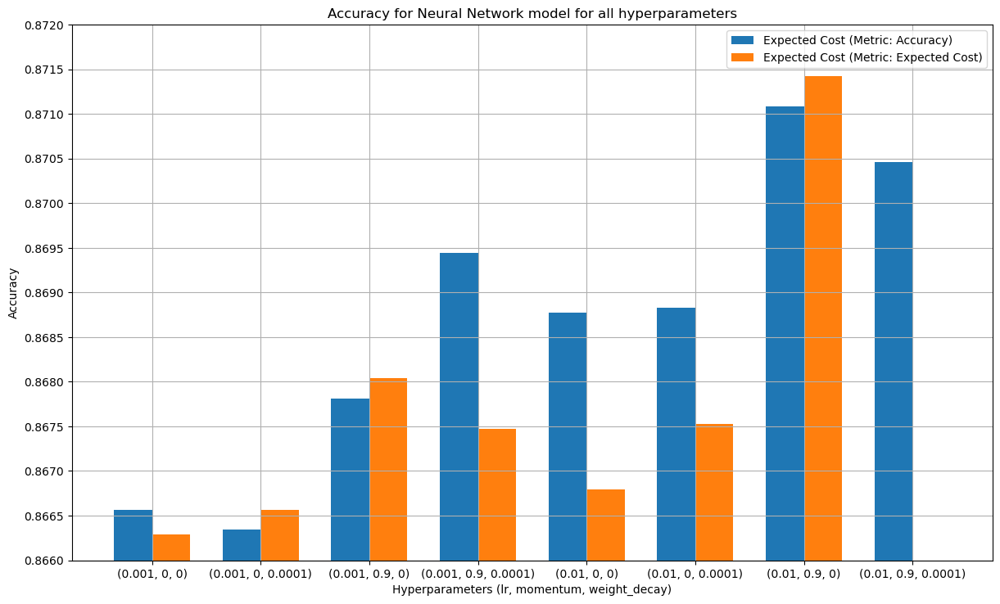

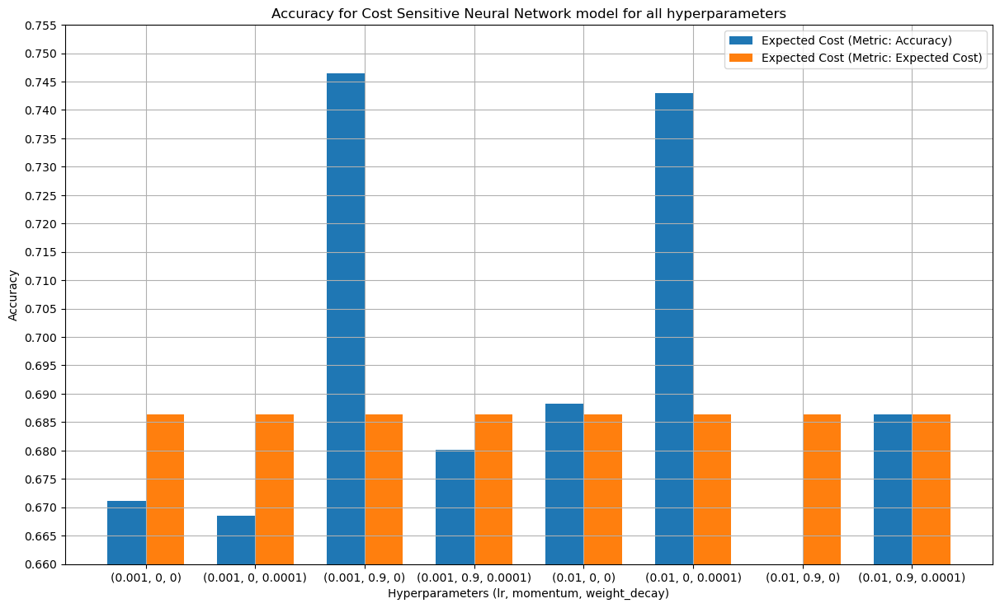

In [80]:
def plot_func(metric1, metric2, name, range):

    fig, ax = plt.subplots()
    width = 0.35
    ax.bar(string_hyperparameters_list, metric1, width, label='Expected Cost (Metric: Accuracy)')
    ax.bar(np.arange(len(string_hyperparameters_list)) + width, metric2, width, label='Expected Cost (Metric: Expected Cost)')

    ax.legend()
    ax.set_xlabel('Hyperparameters (lr, momentum, weight_decay)')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Accuracy for {name} model for all hyperparameters')
    ax.set_yticks(range)
    ax.set_xticks(np.arange(len(string_hyperparameters_list)) + width/2)
    fig.set_size_inches(14.5, 8.5)
    ax.set_ylim(range[0], range[-1])
    ax.grid()
    plt.show()
    
plot_func(test_accuracy_list_cost_lr, test_accuracy_list_cost_lr2, 'Cost Sensitive LR', np.arange(0.6, 0.68, 0.005))
plot_func(test_accuracy_list_lr, test_accuracy_list_lr2, 'LR', np.arange(0.866, 0.8685, 0.0001))
plot_func(test_accuracy_list_nn, test_accuracy_list_nn2, 'Neural Network', np.arange(0.866, 0.872, 0.0005))
plot_func(test_accuracy_list_nn_cs, test_accuracy_list_nn_cs2, 'Cost Sensitive Neural Network', np.arange(0.66, 0.76, 0.005))

In [11]:
hyperparameters_list = []
lr_values = [0.001, 0.01]
momentum_values = [0, 0.9]
weight_decay_values = [0, 0.0001]

for lr in lr_values:
    for momentum in momentum_values:
        for weight_decay in weight_decay_values:
            hyperparameters_list.append((lr, momentum, weight_decay))

string_hyperparameters_list = [str(hyperparameters_list[i]) for i in range(len(hyperparameters_list))]
# print(string_hyperparameters_list)

print(hyperparameters_list[np.argmax(expected_costs_list_cost_lr)])
print(hyperparameters_list[np.argmax(expected_costs_list_cost_lr2)])
print(hyperparameters_list[np.argmax(expected_costs_list_lr)])
print(hyperparameters_list[np.argmax(expected_costs_list_lr2)])
print(hyperparameters_list[np.argmax(expected_costs_list_nn)])
print(hyperparameters_list[np.argmax(expected_costs_list_nn2)])
print(hyperparameters_list[np.argmax(expected_costs_list_nn_cs)])
print(hyperparameters_list[np.argmax(expected_costs_list_nn_cs2)])

(0.01, 0, 0)
(0.001, 0, 0.0001)
(0.001, 0, 0)
(0.001, 0, 0.0001)
(0.001, 0, 0.0001)
(0.001, 0, 0)
(0.01, 0.9, 0)
(0.001, 0, 0)


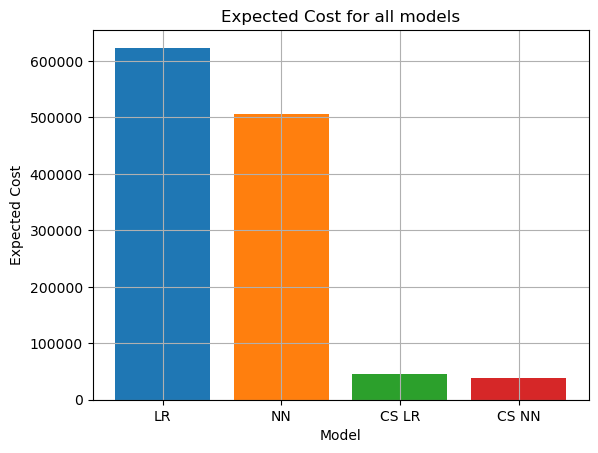

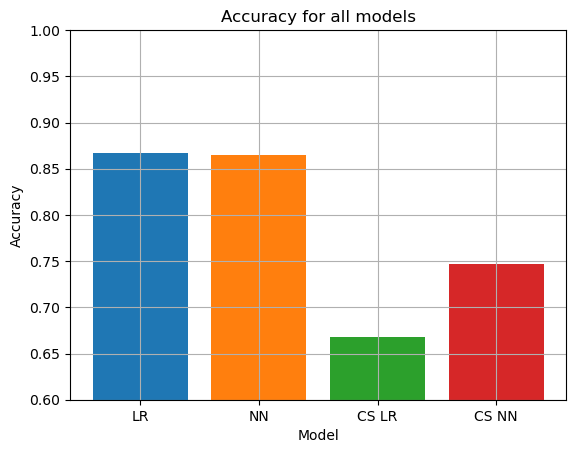

In [30]:
if min(expected_costs_list_cost_lr) < min(expected_costs_list_cost_lr2):
    best_expected_cost_cost_lr = min(expected_costs_list_cost_lr)
    best_accuracy_cost_lr = test_accuracy_list_cost_lr[np.argmin(expected_costs_list_cost_lr)]
else:
    best_expected_cost_cost_lr = min(expected_costs_list_cost_lr2)
    best_accuracy_cost_lr = test_accuracy_list_cost_lr2[np.argmin(expected_costs_list_cost_lr2)]
    
if min(expected_costs_list_lr) < min(expected_costs_list_lr2):
    best_expected_cost_lr = min(expected_costs_list_lr)
    best_accuracy_lr = test_accuracy_list_lr[np.argmin(expected_costs_list_lr)]
else:
    best_expected_cost_lr = min(expected_costs_list_lr2)
    best_accuracy_lr = test_accuracy_list_lr2[np.argmin(expected_costs_list_lr2)]

if min(expected_costs_list_nn) < min(expected_costs_list_nn2):
    best_expected_cost_nn = min(expected_costs_list_nn)
    best_accuracy_nn = test_accuracy_list_nn[np.argmin(expected_costs_list_nn)]
else:
    best_expected_cost_nn = min(expected_costs_list_nn2)
    best_accuracy_nn = test_accuracy_list_nn2[np.argmin(expected_costs_list_nn2)]
    
if min(expected_costs_list_nn_cs) < min(expected_costs_list_nn_cs2):
    best_expected_cost_nn_cs = min(expected_costs_list_nn_cs)
    best_accuracy_nn_cs = test_accuracy_list_nn_cs[np.argmin(expected_costs_list_nn_cs)]
else:
    best_expected_cost_nn_cs = min(expected_costs_list_nn_cs2)
    best_accuracy_nn_cs = test_accuracy_list_nn_cs2[np.argmin(expected_costs_list_nn_cs2)]
    
import matplotlib.cm as cm

plt.figure()
plt.grid()
bars = plt.bar(['LR', 'NN', 'CS LR', 'CS NN'], [best_expected_cost_lr, best_expected_cost_nn, best_expected_cost_cost_lr, best_expected_cost_nn_cs], color=cm.tab10(np.arange(4)))
# plt.legend()
plt.xlabel('Model')
plt.ylabel('Expected Cost')
plt.title('Expected Cost for all models')

plt.show()

plt.figure()
plt.grid()
plt.bar(['LR', 'NN', 'CS LR', 'CS NN'], [best_accuracy_lr, best_accuracy_nn, best_accuracy_cost_lr, best_accuracy_nn_cs], color=cm.tab10(np.arange(4)))
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy for all models')
plt.ylim(0.6, 1)
plt.show()
